# AI-ML Process: A Comprehensive Guide

## Table of Contents
- 1. Introduction to AI-ML
- 2. Data Science
- 3. Machine Learning
- 4. Data Visualization
- 5. Deep Learning
- 6. Neural Networks
- 7. Deployment Options
- 8. Additional Important Topics
- 9. Case Study: End-to-End ML Project
- 10. Summary and Future Directions

## Data File Setup

First, let's create all the necessary files mentioned in this guide:


In [1]:
# # This code block creates all necessary data files mentioned throughout this guide
# import pandas as pd
# import numpy as np
# import sqlite3
# import pickle
# import os
# from sklearn.datasets import load_iris, load_boston, load_digits
# from sklearn.ensemble import RandomForestClassifier
# import tensorflow as tf

# # Create directories if they don't exist
# os.makedirs('data', exist_ok=True)

# # Create CSV file
# iris_data = load_iris()
# iris_df = pd.DataFrame(data=iris.data, columns=iris.feature_names)
# iris_df['target'] = iris.target
# iris_df.to_csv('data/iris.csv', index=False)
# print("Created data/iris.csv")

# # Create general data.csv with synthetic data
# np.random.seed(42)
# data = {
#     'age': np.random.randint(18, 65, 100),
#     'income': np.random.randint(30000, 120000, 100),
#     'gender': np.random.choice(['M', 'F'], 100),
#     'education': np.random.choice(['High School', 'Bachelor', 'Master', 'PhD'], 100),
#     'id': range(1, 101)
# }
# pd.DataFrame(data).to_csv('data.csv', index=False)
# print("Created data.csv")

# # Create SQLite database
# conn = sqlite3.connect('database.db')
# pd.DataFrame(data).to_sql('table_name', conn, if_exists='replace', index=False)
# conn.close()
# print("Created database.db with table 'table_name'")

# # Create model.pkl for API example
# model = RandomForestClassifier(n_estimators=10, random_state=42)
# model.fit(iris_df.iloc[:, :-1], iris_df['target'])
# with open('model.pkl', 'wb') as f:
#     pickle.dump(model, f)
# print("Created model.pkl")

# # Create preprocessed_data.csv
# preprocessed_data = iris_df.copy()
# preprocessed_data.iloc[:, :-1] = (preprocessed_data.iloc[:, :-1] - preprocessed_data.iloc[:, :-1].mean()) / preprocessed_data.iloc[:, :-1].std()
# preprocessed_data.to_csv('data/preprocessed_data.csv', index=False)
# print("Created data/preprocessed_data.csv")

# # Create TF model for deep learning examples
# def create_simple_model():
#     model = tf.keras.Sequential([
#         tf.keras.layers.Dense(64, activation='relu', input_shape=(4,)),
#         tf.keras.layers.Dense(32, activation='relu'),
#         tf.keras.layers.Dense(3, activation='softmax')
#     ])
#     model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
#     return model

# simple_model = create_simple_model()
# simple_model.fit(iris_df.iloc[:, :-1], iris_df['target'], epochs=5, verbose=0)
# simple_model.save('best_model.h5')
# print("Created best_model.h5")

# print("All necessary files have been created successfully!")

```
ImportError: 
`load_boston` has been removed from scikit-learn since version 1.2.

The Boston housing prices dataset has an ethical problem: as
investigated in [1], the authors of this dataset engineered a
non-invertible variable "B" assuming that racial self-segregation had a
positive impact on house prices [2]. Furthermore the goal of the
research that led to the creation of this dataset was to study the
impact of air quality but it did not give adequate demonstration of the
validity of this assumption.

The scikit-learn maintainers therefore strongly discourage the use of
this dataset unless the purpose of the code is to study and educate
about ethical issues in data science and machine learning.

In this special case, you can fetch the dataset from the original
source::

    import pandas as pd
    import numpy as np

    data_url = "http://lib.stat.cmu.edu/datasets/boston"
    raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
    data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
    target = raw_df.values[1::2, 2]

Alternative datasets include the California housing dataset and the
Ames housing dataset. You can load the datasets as follows::

    from sklearn.datasets import fetch_california_housing
    housing = fetch_california_housing()

for the California housing dataset and::

    from sklearn.datasets import fetch_openml
    housing = fetch_openml(name="house_prices", as_frame=True)

for the Ames housing dataset.

[1] M Carlisle.
"Racist data destruction?"
<https://medium.com/@docintangible/racist-data-destruction-113e3eff54a8>

[2] Harrison Jr, David, and Daniel L. Rubinfeld.
"Hedonic housing prices and the demand for clean air."
Journal of environmental economics and management 5.1 (1978): 81-102.
<https://www.researchgate.net/publication/4974606_Hedonic_housing_prices_and_the_demand_for_clean_air>
```

In [2]:
# This code block creates all necessary data files mentioned throughout this guide
import pandas as pd
import numpy as np
import sqlite3
import pickle
import os
from sklearn.datasets import load_iris, load_digits, fetch_california_housing
from sklearn.ensemble import RandomForestClassifier
import tensorflow as tf

# Create directories if they don't exist
os.makedirs('data', exist_ok=True)

# Create CSV file from iris dataset
iris_data = load_iris()
iris_df = pd.DataFrame(data=iris_data.data, columns=iris_data.feature_names)
iris_df['target'] = iris_data.target
iris_df.to_csv('data/iris.csv', index=False)
print("Created data/iris.csv")

# Create general data.csv with synthetic data
np.random.seed(42)
data = {
    'age': np.random.randint(18, 65, 100),
    'income': np.random.randint(30000, 120000, 100),
    'gender': np.random.choice(['M', 'F'], 100),
    'education': np.random.choice(['High School', 'Bachelor', 'Master', 'PhD'], 100),
    'id': range(1, 101)
}
pd.DataFrame(data).to_csv('data.csv', index=False)
print("Created data.csv")

# Create SQLite database
conn = sqlite3.connect('database.db')
pd.DataFrame(data).to_sql('table_name', conn, if_exists='replace', index=False)
conn.close()
print("Created database.db with table 'table_name'")

# Create model.pkl for API example
model = RandomForestClassifier(n_estimators=10, random_state=42)
model.fit(iris_df.iloc[:, :-1], iris_df['target'])
with open('model.pkl', 'wb') as f:
    pickle.dump(model, f)
print("Created model.pkl")

# Create preprocessed_data.csv
preprocessed_data = iris_df.copy()
preprocessed_data.iloc[:, :-1] = (
    preprocessed_data.iloc[:, :-1] - preprocessed_data.iloc[:, :-1].mean()
) / preprocessed_data.iloc[:, :-1].std()
preprocessed_data.to_csv('data/preprocessed_data.csv', index=False)
print("Created data/preprocessed_data.csv")

# Create TF model for deep learning examples using Input() and .keras format
def create_simple_model():
    inputs = tf.keras.Input(shape=(4,))
    x = tf.keras.layers.Dense(64, activation='relu')(inputs)
    x = tf.keras.layers.Dense(32, activation='relu')(x)
    outputs = tf.keras.layers.Dense(3, activation='softmax')(x)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

simple_model = create_simple_model()
simple_model.fit(iris_df.iloc[:, :-1], iris_df['target'], epochs=5, verbose=0)
simple_model.save('best_model.keras')  # Use modern Keras format
print("Created best_model.keras")

# Create CSV file from California Housing dataset
california = fetch_california_housing(as_frame=True)
california_df = california.frame
california_df.to_csv('data/california_housing.csv', index=False)
print("Created data/california_housing.csv")

print("All necessary files have been created successfully!")

Created data/iris.csv
Created data.csv
Created database.db with table 'table_name'
Created model.pkl
Created data/preprocessed_data.csv
Created best_model.keras
Created data/california_housing.csv
All necessary files have been created successfully!


## 1. Introduction to AI-ML

Artificial Intelligence (AI) and Machine Learning (ML) form a spectrum of technologies enabling computers to perform tasks that typically require human intelligence. The AI-ML lifecycle involves several interconnected stages that transform raw data into actionable insights or automated systems.

### The AI-ML Pipeline

The complete AI-ML process typically follows these stages:

1. **Problem Definition**: Clearly defining the problem to solve
2. **Data Collection**: Gathering relevant data from various sources
3. **Data Cleaning & Preprocessing**: Preparing data for analysis
4. **Exploratory Data Analysis**: Understanding data patterns and relationships
5. **Feature Engineering**: Creating or selecting informative features
6. **Model Selection & Training**: Choosing algorithms and training models
7. **Model Evaluation**: Assessing model performance
8. **Model Deployment**: Implementing models in production environments
9. **Monitoring & Maintenance**: Ensuring continued performance

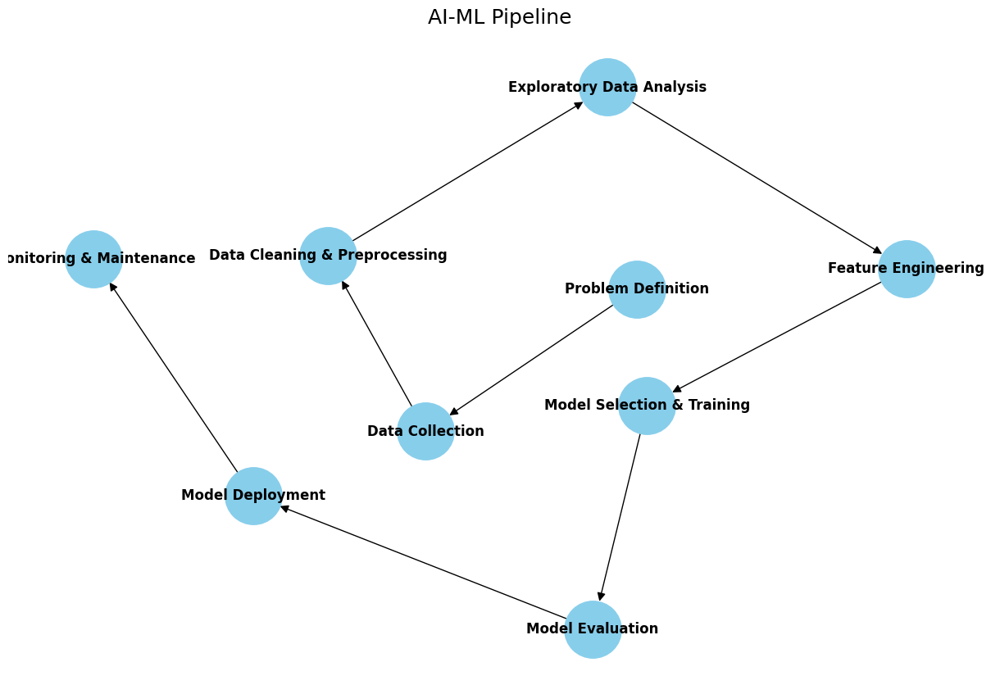

In [3]:
import matplotlib.pyplot as plt
import networkx as nx

# AI-ML pipeline phases
ai_ml_pipeline = {
    "phase1": "Problem Definition",
    "phase2": "Data Collection",
    "phase3": "Data Cleaning & Preprocessing",
    "phase4": "Exploratory Data Analysis",
    "phase5": "Feature Engineering",
    "phase6": "Model Selection & Training",
    "phase7": "Model Evaluation",
    "phase8": "Model Deployment",
    "phase9": "Monitoring & Maintenance"
}

# Create directed graph
G = nx.DiGraph()
for i in range(1, len(ai_ml_pipeline) + 1):
    G.add_node(f"phase{i}", label=ai_ml_pipeline[f"phase{i}"])
    if i > 1:
        G.add_edge(f"phase{i-1}", f"phase{i}")

# Use spring_layout with seed and k for better spacing (vertical stretching)
pos = nx.spring_layout(G, seed=42, k=0.8)

plt.figure(figsize=(12, 8))  # Taller figure for better vertical spacing
nx.draw(
    G, pos, 
    with_labels=False, 
    node_size=2500, 
    node_color="skyblue", 
    arrows=True, 
    arrowsize=15
)

# Draw node labels separately for better control
node_labels = {node: data['label'] for node, data in G.nodes(data=True)}
nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=12, font_weight='bold')

plt.title("AI-ML Pipeline", fontsize=18)
plt.axis('off')

# Manual adjustment of layout margins (avoid tight_layout warning)
plt.subplots_adjust(left=0.05, right=0.95, top=0.9, bottom=0.05)

plt.show()

## 2. Data Science

Data Science forms the foundation of AI and ML by focusing on extracting knowledge and insights from data through statistical methods, algorithms, and tools.

### 2.1 Data Collection

Data collection involves gathering information from various sources such as databases, APIs, web scraping, or sensors.

In [4]:
# Example: Collecting data from different sources
import pandas as pd
import requests
from io import StringIO
from bs4 import BeautifulSoup

# 1. From CSV file
df_csv = pd.read_csv('data.csv')
print('\nCSV [data.csv]:\n', df_csv.head())

# 2. From a database
import sqlite3
conn = sqlite3.connect('database.db')
df_sql = pd.read_sql_query("SELECT * FROM table_name", conn)
print('\nSQL [database.db]:\n', df_sql.head())

# # 3. From an API
# api_url = "https://api.example.com/data"
# response = requests.get(api_url)
# if response.status_code == 200:
#     data = response.json()
#     df_api = pd.DataFrame(data)
    
# 3. From an API (Real public API for placeholder data)
api_url = "https://jsonplaceholder.typicode.com/posts"
response = requests.get(api_url)
if response.status_code == 200:
    data = response.json()
    df_api = pd.DataFrame(data)
    print('\nAPI [https://jsonplaceholder.typicode.com/posts]:\n', df_api.head())

# # 4. Web scraping
# from bs4 import BeautifulSoup
# html = requests.get("https://example.com").text
# soup = BeautifulSoup(html, 'html.parser')
# # Extract data from HTML elements

# 4. Web scraping (Real website for scraping practice)
html = requests.get("https://quotes.toscrape.com/").text
soup = BeautifulSoup(html, 'html.parser')
# Extract quote texts
quotes = [quote.text.strip() for quote in soup.select(".quote .text")]
authors = [author.text.strip() for author in soup.select(".quote .author")]
# Create DataFrame
df_quotes = pd.DataFrame({'quote': quotes, 'author': authors})
print('\nWEB [https://quotes.toscrape.com/]:\n', df_quotes.head())


CSV [data.csv]:
    age  income gender    education  id
0   56   32695      M          PhD   1
1   46   78190      F  High School   2
2   32   35258      M          PhD   3
3   60  117538      M          PhD   4
4   25   69504      M       Master   5

SQL [database.db]:
    age  income gender    education  id
0   56   32695      M          PhD   1
1   46   78190      F  High School   2
2   32   35258      M          PhD   3
3   60  117538      M          PhD   4
4   25   69504      M       Master   5

API [https://jsonplaceholder.typicode.com/posts]:
    userId  id                                              title  \
0       1   1  sunt aut facere repellat provident occaecati e...   
1       1   2                                       qui est esse   
2       1   3  ea molestias quasi exercitationem repellat qui...   
3       1   4                               eum et est occaecati   
4       1   5                                 nesciunt quas odio   

                                

### 2.2 Data Cleaning and Preprocessing

Raw data often contains errors, missing values, and inconsistencies that must be addressed before analysis.

In [5]:
# Data cleaning example
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Load sample data
data = {
    'age': [25, 30, np.nan, 40, 35],
    'income': [50000, np.nan, 75000, 60000, 65000],
    'gender': ['M', 'F', 'M', 'F', None]
}
df = pd.DataFrame(data)

# 1. Check for missing values
print("Missing values:\n", df.isnull().sum())

# 2. Handle missing values (FIXED for pandas 3.x compatibility)
# Fill numeric values with mean
df['age'] = df['age'].fillna(df['age'].mean())
df['income'] = df['income'].fillna(df['income'].mean())

# Fill categorical values with mode
df['gender'] = df['gender'].fillna(df['gender'].mode()[0])

# 3. Check for duplicates
duplicate_rows = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicate_rows}")

# 4. Remove duplicates if any
df = df.drop_duplicates()

# 5. Convert data types
df['age'] = df['age'].astype(int)

# 6. Standardization of numerical features
scaler = StandardScaler()
df[['age', 'income']] = scaler.fit_transform(df[['age', 'income']])

# 7. Encoding categorical variables
df = pd.get_dummies(df, columns=['gender'], drop_first=True)

print("Cleaned data:\n", df.head())

Missing values:
 age       1
income    1
gender    1
dtype: int64
Number of duplicate rows: 0
Cleaned data:
         age    income  gender_M
0 -1.478817 -1.550434      True
1 -0.479616  0.000000     False
2 -0.079936  1.550434      True
3  1.518785 -0.310087     False
4  0.519584  0.310087     False


### 2.3 Exploratory Data Analysis (EDA)

EDA helps understand data characteristics, identify patterns, and generate hypotheses through visualization and statistical analysis.

Dataset shape: (150, 5)

Column info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   sepal length (cm)  150 non-null    float64
 1   sepal width (cm)   150 non-null    float64
 2   petal length (cm)  150 non-null    float64
 3   petal width (cm)   150 non-null    float64
 4   species            150 non-null    object 
dtypes: float64(4), object(1)
memory usage: 6.0+ KB
None

Descriptive statistics:
       sepal length (cm)  sepal width (cm)  petal length (cm)  \
count         150.000000        150.000000         150.000000   
mean            5.843333          3.057333           3.758000   
std             0.828066          0.435866           1.765298   
min             4.300000          2.000000           1.000000   
25%             5.100000          2.800000           1.600000   
50%             5.800000          3.000000        

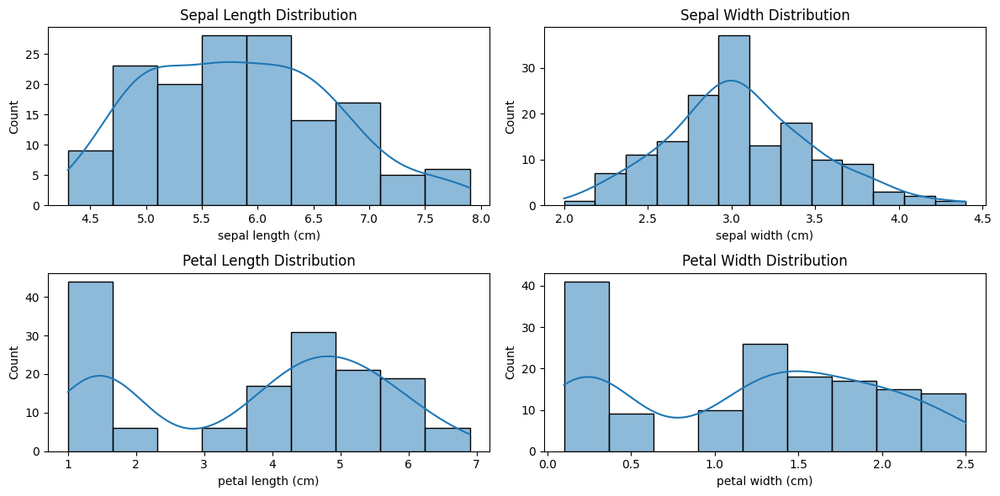

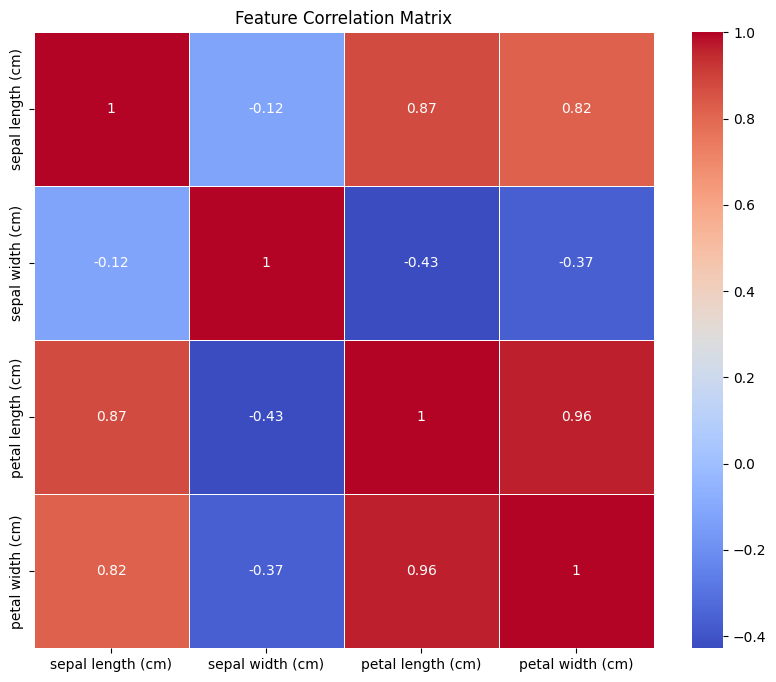

<Figure size 1200x1000 with 0 Axes>

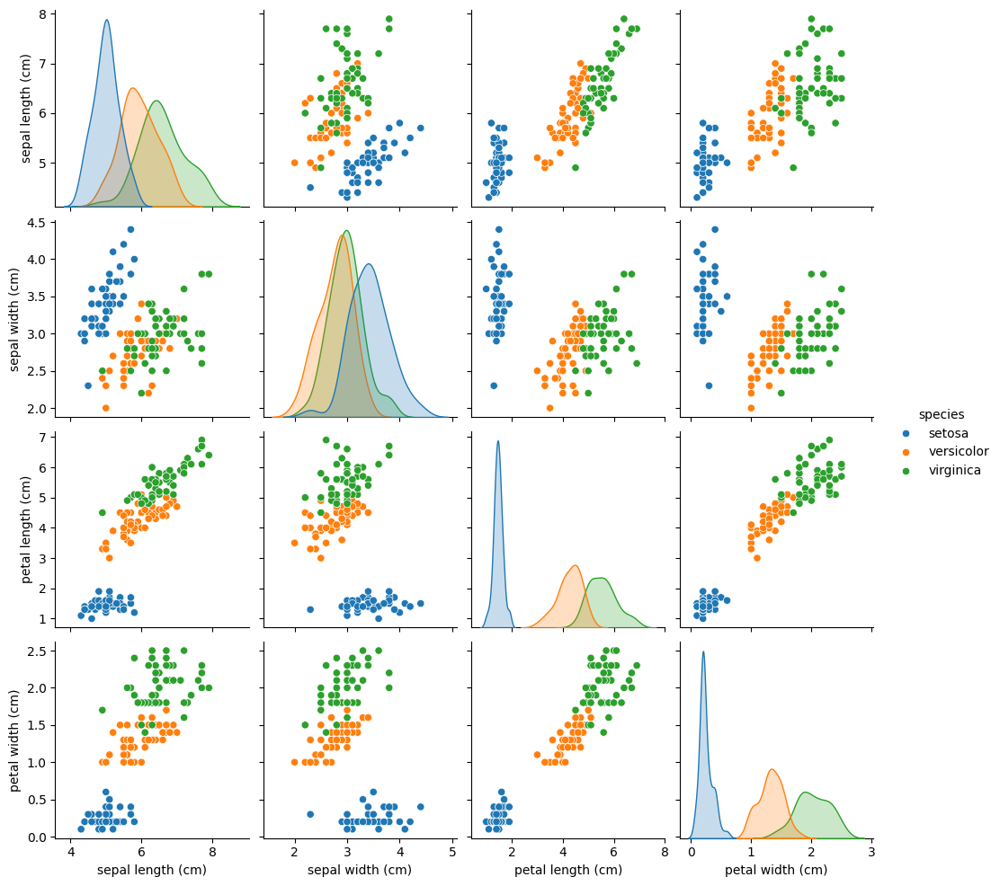

In [6]:
# Exploratory Data Analysis example
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load a sample dataset
from sklearn.datasets import load_iris
iris = load_iris()
df = pd.DataFrame(data=iris.data, columns=iris.feature_names)
df['species'] = [iris.target_names[i] for i in iris.target]

# 1. Basic statistics
print("Dataset shape:", df.shape)
print("\nColumn info:")
print(df.info())
print("\nDescriptive statistics:")
print(df.describe())

# 2. Check for missing values
print("\nMissing values:")
print(df.isnull().sum())

# 3. Visualize distributions
plt.figure(figsize=(12, 6))

plt.subplot(2, 2, 1)
sns.histplot(df['sepal length (cm)'], kde=True)
plt.title('Sepal Length Distribution')

plt.subplot(2, 2, 2)
sns.histplot(df['sepal width (cm)'], kde=True)
plt.title('Sepal Width Distribution')

plt.subplot(2, 2, 3)
sns.histplot(df['petal length (cm)'], kde=True)
plt.title('Petal Length Distribution')

plt.subplot(2, 2, 4)
sns.histplot(df['petal width (cm)'], kde=True)
plt.title('Petal Width Distribution')

plt.tight_layout()
# plt.show()

# 4. Correlation analysis
plt.figure(figsize=(10, 8))
numeric_cols = df.select_dtypes(include=[np.number]).columns
correlation = df[numeric_cols].corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Feature Correlation Matrix')
# plt.show()

# 5. Feature relationships by category
plt.figure(figsize=(12, 10))
sns.pairplot(df, hue='species')
# plt.show()

### 2.4 Feature Engineering

Feature engineering transforms raw data into features that better represent the underlying problem, improving model performance.

In [7]:
# Feature engineering examples
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Sample dataset
data = {
    'age': [25, 30, 35, 40, 45],
    'income': [50000, 60000, 75000, 80000, 85000],
    'gender': ['M', 'F', 'M', 'F', 'M'],
    'education': ['High School', 'Bachelor', 'Master', 'PhD', 'Bachelor'],
    'purchase_date': pd.to_datetime(['2022-01-15', '2022-03-20', '2022-05-10', 
                                     '2022-06-05', '2022-08-22'])
}
df = pd.DataFrame(data)

# 1. Create new features from existing ones
df['income_to_age_ratio'] = df['income'] / df['age']
df['income_category'] = pd.cut(df['income'], 
                              bins=[0, 55000, 75000, 100000], 
                              labels=['Low', 'Medium', 'High'])

# 2. Extract date features
df['purchase_year'] = df['purchase_date'].dt.year
df['purchase_month'] = df['purchase_date'].dt.month
df['purchase_day'] = df['purchase_date'].dt.day
df['purchase_dayofweek'] = df['purchase_date'].dt.dayofweek

# 3. Create interaction features
df['age_education'] = df['age'].astype(str) + '_' + df['education']

# 4. Build a preprocessing pipeline
# Define column types
numeric_features = ['age', 'income']
categorical_features = ['gender', 'education']

# Define preprocessing for numeric columns
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Define preprocessing for categorical columns
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Create and fit the preprocessing pipeline
preprocessing_pipeline = Pipeline(steps=[('preprocessor', preprocessor)])
transformed_features = preprocessing_pipeline.fit_transform(df[numeric_features + categorical_features])

print("Original data shape:", df.shape)
print("Transformed features shape:", transformed_features.shape)

Original data shape: (5, 12)
Transformed features shape: (5, 8)


## 3. Machine Learning

Machine Learning focuses on developing algorithms that learn from data to make predictions or decisions without explicit programming.

### 3.1 Types of Machine Learning

Machine learning approaches can be categorized into three main types:

1. **Supervised Learning**: Models learn from labeled data to predict outcomes
2. **Unsupervised Learning**: Models find patterns in unlabeled data
3. **Reinforcement Learning**: Models learn through interaction with an environment

In [8]:
# # Examples of different types of ML algorithms
# from sklearn.datasets import load_iris, load_boston, make_blobs
# from sklearn.model_selection import train_test_split
# from sklearn.linear_model import LinearRegression, LogisticRegression
# from sklearn.cluster import KMeans
# from sklearn.metrics import accuracy_score, mean_squared_error, silhouette_score
# import matplotlib.pyplot as plt
# import numpy as np

# # 1. Supervised Learning - Classification
# # Load iris dataset
# iris = load_iris()
# X_iris = iris.data
# y_iris = iris.target

# # Split data
# X_train, X_test, y_train, y_test = train_test_split(X_iris, y_iris, test_size=0.2, random_state=42)

# # Train a classifier
# clf = LogisticRegression(max_iter=200)
# clf.fit(X_train, y_train)

# # Evaluate
# y_pred = clf.predict(X_test)
# accuracy = accuracy_score(y_test, y_pred)
# print(f"Classification accuracy: {accuracy:.4f}")

# # 2. Supervised Learning - Regression
# # Load boston housing dataset (for regression)
# boston = load_boston()
# X_boston = boston.data
# y_boston = boston.target

# # Split data
# X_train, X_test, y_train, y_test = train_test_split(X_boston, y_boston, test_size=0.2, random_state=42)

# # Train a regressor
# reg = LinearRegression()
# reg.fit(X_train, y_train)

# # Evaluate
# y_pred = reg.predict(X_test)
# mse = mean_squared_error(y_test, y_pred)
# print(f"Regression MSE: {mse:.4f}")

# # 3. Unsupervised Learning - Clustering
# # Generate blob dataset for clustering
# X_blobs, _ = make_blobs(n_samples=300, centers=4, cluster_std=0.60, random_state=42)

# # Apply KMeans clustering
# kmeans = KMeans(n_clusters=4, random_state=42)
# cluster_labels = kmeans.fit_predict(X_blobs)

# # Evaluate clustering
# silhouette = silhouette_score(X_blobs, cluster_labels)
# print(f"Clustering silhouette score: {silhouette:.4f}")

# # Visualize clusters
# plt.figure(figsize=(10, 6))
# plt.scatter(X_blobs[:, 0], X_blobs[:, 1], c=cluster_labels, cmap='viridis', alpha=0.7)
# plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
#             marker='*', s=200, c='red', label='Centroids')
# plt.title('KMeans Clustering Results')
# plt.legend()
# # plt.show()

```
ImportError: 
`load_boston` has been removed from scikit-learn since version 1.2.

The Boston housing prices dataset has an ethical problem: as
investigated in [1], the authors of this dataset engineered a
non-invertible variable "B" assuming that racial self-segregation had a
positive impact on house prices [2]. Furthermore the goal of the
research that led to the creation of this dataset was to study the
impact of air quality but it did not give adequate demonstration of the
validity of this assumption.

The scikit-learn maintainers therefore strongly discourage the use of
this dataset unless the purpose of the code is to study and educate
about ethical issues in data science and machine learning.

In this special case, you can fetch the dataset from the original
source::

    import pandas as pd
    import numpy as np

    data_url = "http://lib.stat.cmu.edu/datasets/boston"
    raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
    data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
    target = raw_df.values[1::2, 2]

Alternative datasets include the California housing dataset and the
Ames housing dataset. You can load the datasets as follows::

    from sklearn.datasets import fetch_california_housing
    housing = fetch_california_housing()

for the California housing dataset and::

    from sklearn.datasets import fetch_openml
    housing = fetch_openml(name="house_prices", as_frame=True)

for the Ames housing dataset.

[1] M Carlisle.
"Racist data destruction?"
<https://medium.com/@docintangible/racist-data-destruction-113e3eff54a8>

[2] Harrison Jr, David, and Daniel L. Rubinfeld.
"Hedonic housing prices and the demand for clean air."
Journal of environmental economics and management 5.1 (1978): 81-102.
<https://www.researchgate.net/publication/4974606_Hedonic_housing_prices_and_the_demand_for_clean_air>
```

Classification accuracy: 1.0000
Regression MSE (California Housing): 0.5559
Clustering silhouette score: 0.8756


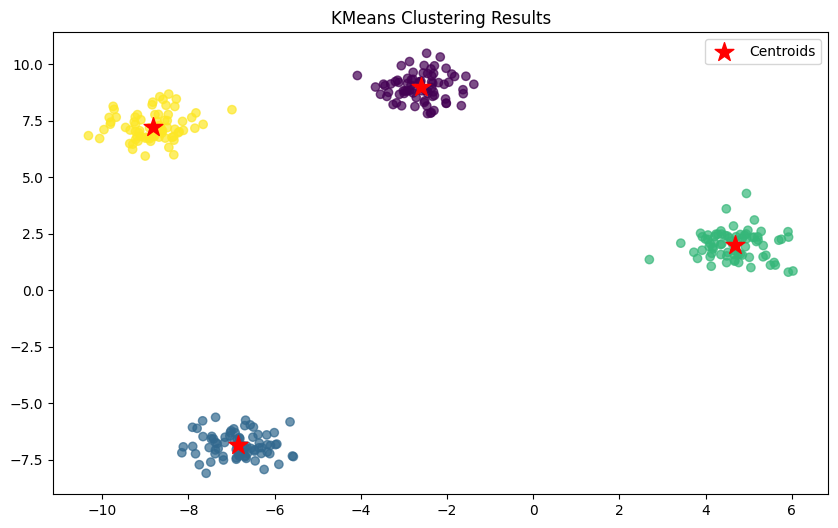

In [9]:
# Examples of different types of ML algorithms
from sklearn.datasets import load_iris, fetch_california_housing, make_blobs
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score, mean_squared_error, silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# 1. Supervised Learning - Classification
# Load iris dataset
iris = load_iris()
X_iris = iris.data
y_iris = iris.target

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_iris, y_iris, test_size=0.2, random_state=42)

# Train a classifier
clf = LogisticRegression(max_iter=200)
clf.fit(X_train, y_train)

# Evaluate
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Classification accuracy: {accuracy:.4f}")

# 2. Supervised Learning - Regression
# Load California housing dataset (instead of Boston)
california = fetch_california_housing()
X_cal = california.data
y_cal = california.target

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_cal, y_cal, test_size=0.2, random_state=42)

# Train a regressor
reg = LinearRegression()
reg.fit(X_train, y_train)

# Evaluate
y_pred = reg.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f"Regression MSE (California Housing): {mse:.4f}")

# 3. Unsupervised Learning - Clustering
# Generate blob dataset for clustering
X_blobs, _ = make_blobs(n_samples=300, centers=4, cluster_std=0.60, random_state=42)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=4, random_state=42)
cluster_labels = kmeans.fit_predict(X_blobs)

# Evaluate clustering
silhouette = silhouette_score(X_blobs, cluster_labels)
print(f"Clustering silhouette score: {silhouette:.4f}")

# Visualize clusters
plt.figure(figsize=(10, 6))
plt.scatter(X_blobs[:, 0], X_blobs[:, 1], c=cluster_labels, cmap='viridis', alpha=0.7)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], 
            marker='*', s=200, c='red', label='Centroids')
plt.title('KMeans Clustering Results')
plt.legend()
# plt.show()

### 3.2 Model Training and Evaluation

This process involves training algorithms on data and evaluating their performance using appropriate metrics.

Model Performance Comparison:
           Logistic Regression  Random Forest  Support Vector Machine
accuracy              0.973684       0.964912                0.982456
precision             0.972222       0.958904                0.972603
recall                0.985915       0.985915                1.000000
f1                    0.979021       0.972222                0.986111
auc                   0.997380       0.995251                0.997380
cv_mean               0.973626       0.958242                0.975824
cv_std                0.017855       0.017582                0.012815


Text(70.72222222222221, 0.5, 'Actual')

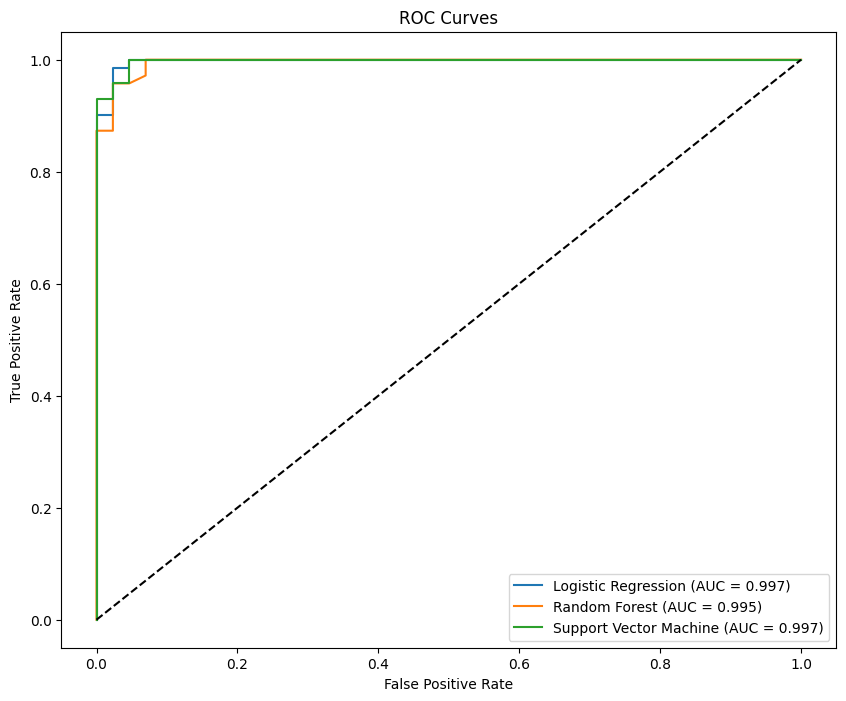

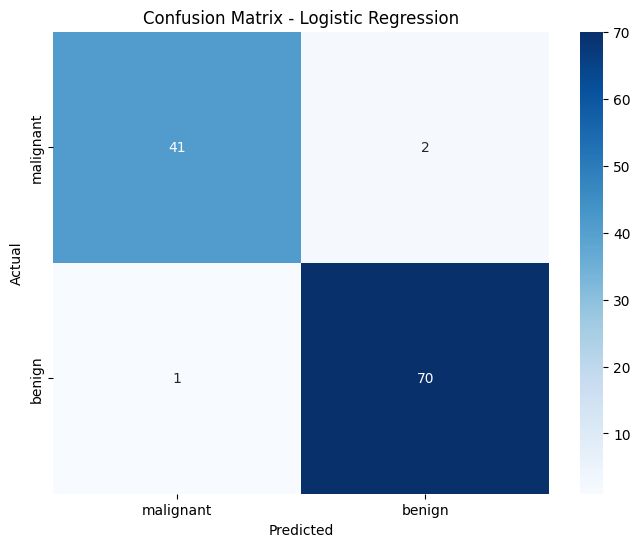

In [10]:
# Model training and evaluation example
import pandas as pd
import numpy as np
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import confusion_matrix, classification_report, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
data = load_breast_cancer()
X = data.data
y = data.target

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocessing
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train multiple models
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Support Vector Machine": SVC(probability=True, random_state=42)
}

# Performance metrics storage
results = {}

for name, model in models.items():
    # Train the model
    model.fit(X_train_scaled, y_train)
    
    # Make predictions
    y_pred = model.predict(X_test_scaled)
    y_prob = model.predict_proba(X_test_scaled)[:, 1]
    
    # Calculate metrics
    results[name] = {
        "accuracy": accuracy_score(y_test, y_pred),
        "precision": precision_score(y_test, y_pred),
        "recall": recall_score(y_test, y_pred),
        "f1": f1_score(y_test, y_pred),
        "auc": roc_auc_score(y_test, y_prob)
    }
    
    # Cross-validation
    cv_scores = cross_val_score(model, X_train_scaled, y_train, cv=5)
    results[name]["cv_mean"] = cv_scores.mean()
    results[name]["cv_std"] = cv_scores.std()
    
    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    results[name]["confusion_matrix"] = cm

# Convert results to DataFrame
metrics_df = pd.DataFrame(
    {model: {metric: results[model][metric] 
             for metric in ["accuracy", "precision", "recall", "f1", "auc", "cv_mean", "cv_std"]} 
     for model in results.keys()}
)

print("Model Performance Comparison:")
print(metrics_df)

# Plot ROC curves
plt.figure(figsize=(10, 8))
for name, model in models.items():
    y_prob = model.predict_proba(X_test_scaled)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    plt.plot(fpr, tpr, label=f"{name} (AUC = {results[name]['auc']:.3f})")

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend()
# plt.show()

# Show confusion matrix for best model
best_model = max(results, key=lambda x: results[x]["auc"])
plt.figure(figsize=(8, 6))
sns.heatmap(results[best_model]["confusion_matrix"], annot=True, fmt='d', cmap='Blues',
            xticklabels=data.target_names, yticklabels=data.target_names)
plt.title(f'Confusion Matrix - {best_model}')
plt.xlabel('Predicted')
plt.ylabel('Actual')
# plt.show()

### 3.3 Hyperparameter Tuning

Hyperparameter tuning optimizes model parameters that can't be learned directly from training data.

Grid Search Best Parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Grid Search Best Score: 0.9728601252609604
Grid Search Test Accuracy: 0.9722222222222222

Randomized Search Best Parameters: {'bootstrap': False, 'max_depth': None, 'min_samples_leaf': 3, 'min_samples_split': 6, 'n_estimators': 356}
Randomized Search Best Score: 0.9665970772442588
Randomized Search Test Accuracy: 0.9722222222222222


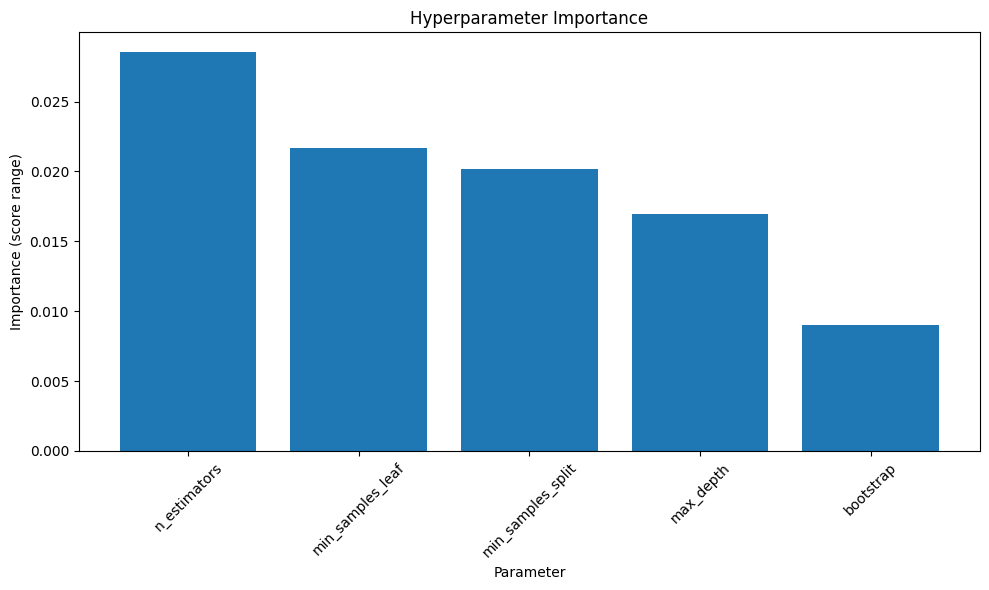

In [11]:
# Hyperparameter tuning example
import pandas as pd
import numpy as np
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from scipy.stats import randint

# Load data
digits = load_digits()
X = digits.data
y = digits.target

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 1. Grid Search CV
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(
    estimator=RandomForestClassifier(random_state=42),
    param_grid=param_grid,
    cv=3,
    n_jobs=-1,
    scoring='accuracy',
    verbose=0
)
grid_search.fit(X_train, y_train)

print("Grid Search Best Parameters:", grid_search.best_params_)
print("Grid Search Best Score:", grid_search.best_score_)

# Evaluate on test set
grid_search_pred = grid_search.predict(X_test)
grid_search_accuracy = accuracy_score(y_test, grid_search_pred)
print("Grid Search Test Accuracy:", grid_search_accuracy)

# 2. Randomized Search CV
param_dist = {
    'n_estimators': randint(50, 500),
    'max_depth': [None] + list(randint(5, 50).rvs(5)),
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 10),
    'bootstrap': [True, False]
}

random_search = RandomizedSearchCV(
    estimator=RandomForestClassifier(random_state=42),
    param_distributions=param_dist,
    n_iter=20,
    cv=3,
    n_jobs=-1,
    scoring='accuracy',
    verbose=0,
    random_state=42
)
random_search.fit(X_train, y_train)

print("\nRandomized Search Best Parameters:", random_search.best_params_)
print("Randomized Search Best Score:", random_search.best_score_)

# Evaluate on test set
random_search_pred = random_search.predict(X_test)
random_search_accuracy = accuracy_score(y_test, random_search_pred)
print("Randomized Search Test Accuracy:", random_search_accuracy)

# Visualize parameter importance safely
results = pd.DataFrame(random_search.cv_results_)
params = ['param_' + p for p in param_dist.keys()]
scores = results['mean_test_score']

# Calculate importance for each parameter
param_importance = {}
for param in params:
    unique_values = results[param].dropna().unique()
    scores_by_param = {}
    for value in unique_values:
        value_scores = results.loc[results[param] == value, 'mean_test_score'].values
        if len(value_scores) > 0:
            scores_by_param[value] = np.mean(value_scores)
        else:
            scores_by_param[value] = np.nan
    # Only calculate range if we have valid values
    valid_scores = [v for v in scores_by_param.values() if not np.isnan(v)]
    if valid_scores:
        param_importance[param] = np.max(valid_scores) - np.min(valid_scores)
    else:
        param_importance[param] = 0  # or np.nan

# Sort and plot
sorted_importance = {k: v for k, v in sorted(param_importance.items(), key=lambda item: item[1], reverse=True)}

plt.figure(figsize=(10, 6))
plt.bar(range(len(sorted_importance)), list(sorted_importance.values()), align='center')
plt.xticks(range(len(sorted_importance)), [p.replace('param_', '') for p in sorted_importance.keys()], rotation=45)
plt.title('Hyperparameter Importance')
plt.xlabel('Parameter')
plt.ylabel('Importance (score range)')
plt.tight_layout()
# plt.show()

## 4. Data Visualization

Data visualization transforms complex data into visual representations that make insights accessible and actionable.

### 4.1 Basic Visualizations

Common visualization types like line plots, bar charts, histograms, and scatter plots are essential for data exploration.

<Figure size 1200x600 with 0 Axes>

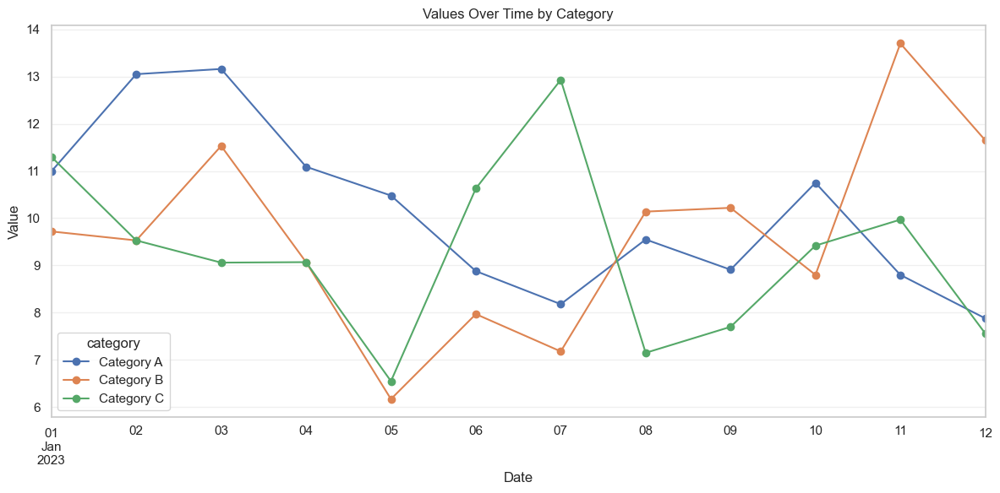

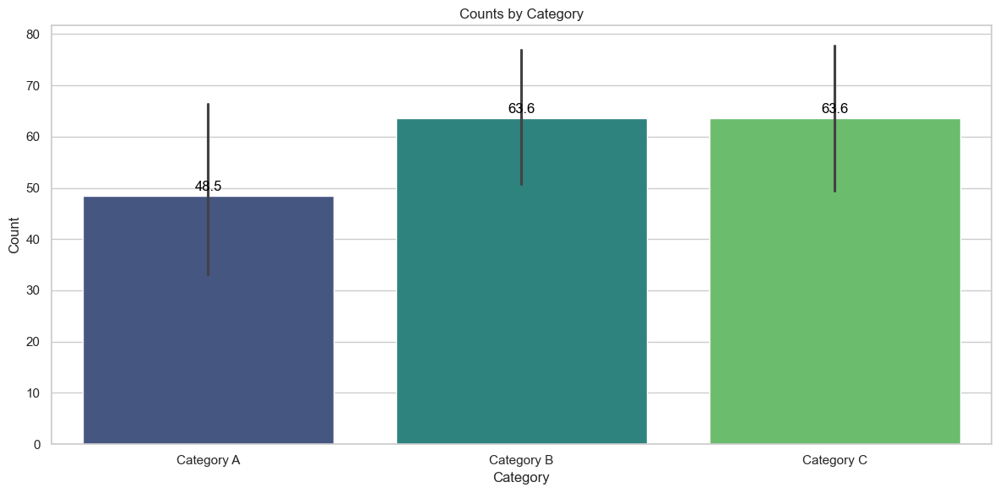

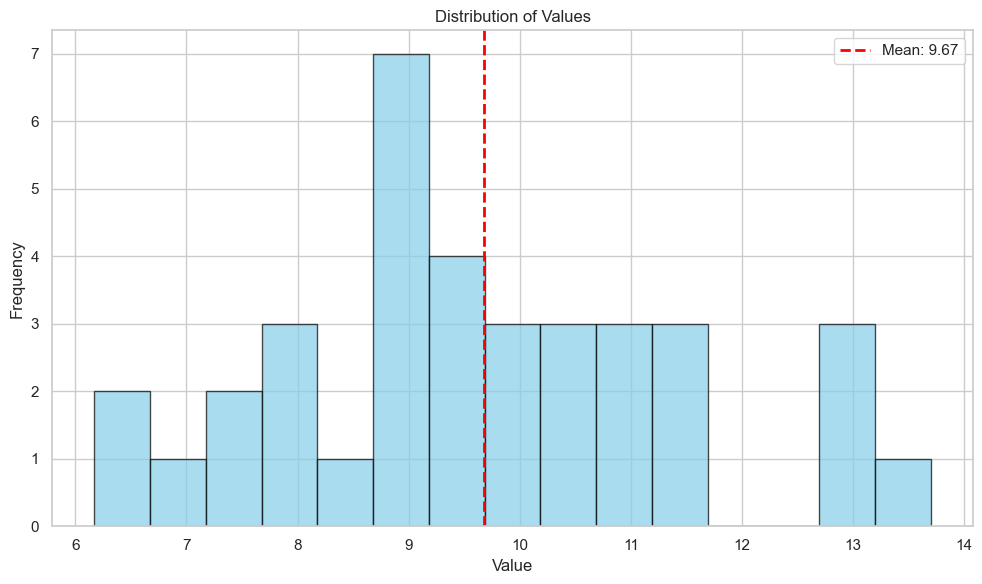

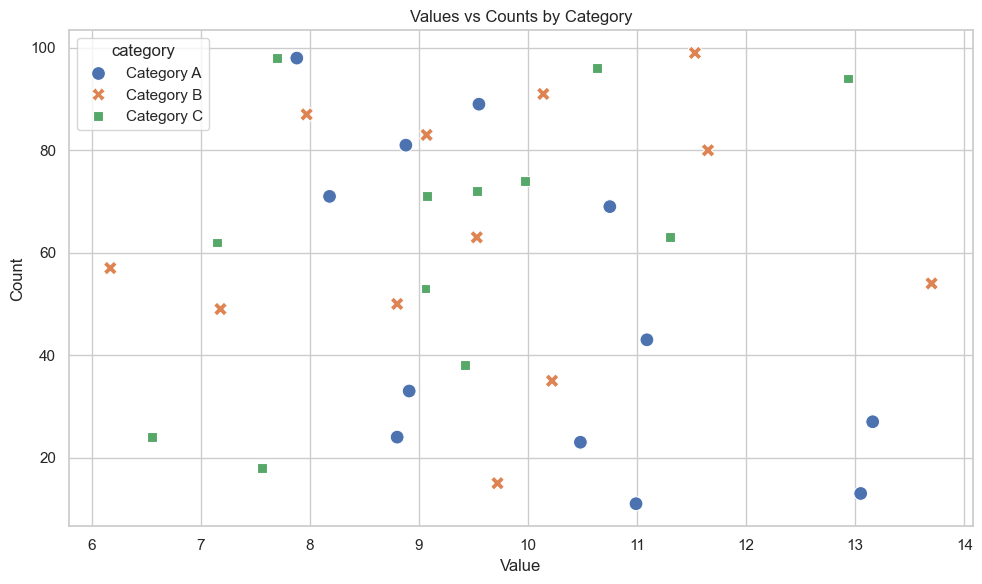

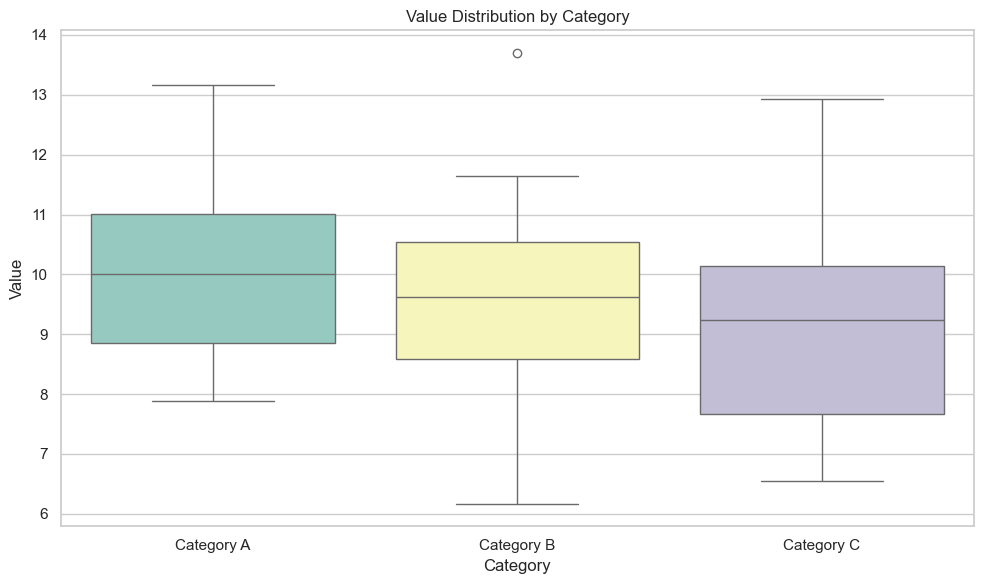

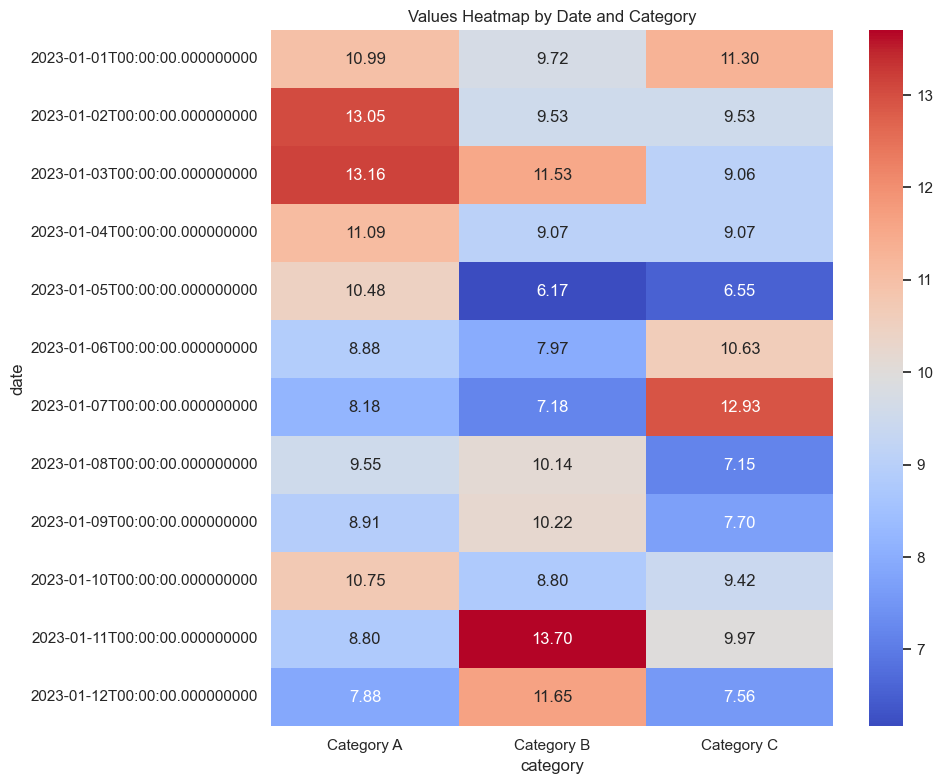

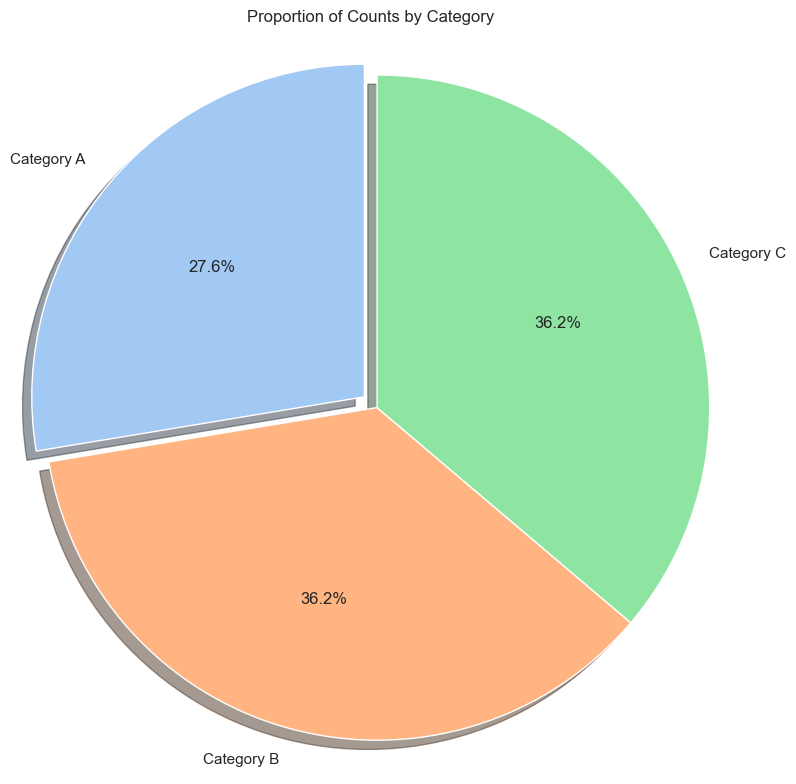

In [12]:
# Basic visualization examples
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Create sample data
np.random.seed(42)
dates = pd.date_range('20230101', periods=12)
categories = ['Category A', 'Category B', 'Category C']
data = {
    'date': np.repeat(dates, 3),
    'category': categories * 12,
    'values': np.random.normal(10, 2, 36).round(2),
    'counts': np.random.randint(10, 100, 36)
}
df = pd.DataFrame(data)

# Set style
sns.set(style="whitegrid")

# 1. Line Plot
plt.figure(figsize=(12, 6))
line_data = df.pivot_table(index='date', columns='category', values='values')
line_data.plot(figsize=(12, 6), marker='o')
plt.title('Values Over Time by Category')
plt.xlabel('Date')
plt.ylabel('Value')
plt.grid(True, alpha=0.3)
plt.tight_layout()
# plt.show()

# 2. Bar Chart (fixed palette + hue warning)
plt.figure(figsize=(12, 6))
bars = sns.barplot(data=df, x='category', y='counts', hue='category', palette='viridis', legend=False)
plt.title('Counts by Category')
plt.xlabel('Category')
plt.ylabel('Count')
# Add value labels
for i, bar in enumerate(bars.patches):
    bars.text(bar.get_x() + bar.get_width()/2., 
              bar.get_height() + 1, 
              round(bar.get_height(), 1), 
              ha='center', color='black')
plt.tight_layout()
# plt.show()

# 3. Histogram
plt.figure(figsize=(10, 6))
plt.hist(df['values'], bins=15, color='skyblue', edgecolor='black', alpha=0.7)
plt.axvline(df['values'].mean(), color='red', linestyle='dashed', linewidth=2, label=f'Mean: {df["values"].mean():.2f}')
plt.title('Distribution of Values')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.legend()
plt.tight_layout()
# plt.show()

# 4. Scatter Plot
plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(data=df, x='values', y='counts', hue='category', style='category', s=100)
plt.title('Values vs Counts by Category')
plt.xlabel('Value')
plt.ylabel('Count')
plt.tight_layout()
# plt.show()

# 5. Box Plot (fixed palette + hue warning)
plt.figure(figsize=(10, 6))
box = sns.boxplot(data=df, x='category', y='values', hue='category', palette='Set3', legend=False)
plt.title('Value Distribution by Category')
plt.xlabel('Category')
plt.ylabel('Value')
plt.tight_layout()
# plt.show()

# 6. Heatmap (correlation)
pivot_df = df.pivot_table(index='date', columns='category', values='values')
plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(pivot_df, annot=True, fmt='.2f', cmap='coolwarm')
plt.title('Values Heatmap by Date and Category')
plt.tight_layout()
# plt.show()

# 7. Pie Chart
category_totals = df.groupby('category')['counts'].sum()
plt.figure(figsize=(8, 8))
plt.pie(category_totals, labels=category_totals.index, autopct='%1.1f%%', 
        startangle=90, shadow=True, explode=[0.05, 0, 0], colors=sns.color_palette('pastel'))
plt.title('Proportion of Counts by Category')
plt.axis('equal')  # Equal aspect ratio ensures the pie is circular
plt.tight_layout()
# plt.show()

### 4.2 Advanced Visualizations

Advanced visualizations enable deeper insights for specific analysis needs.

<Figure size 1400x800 with 0 Axes>

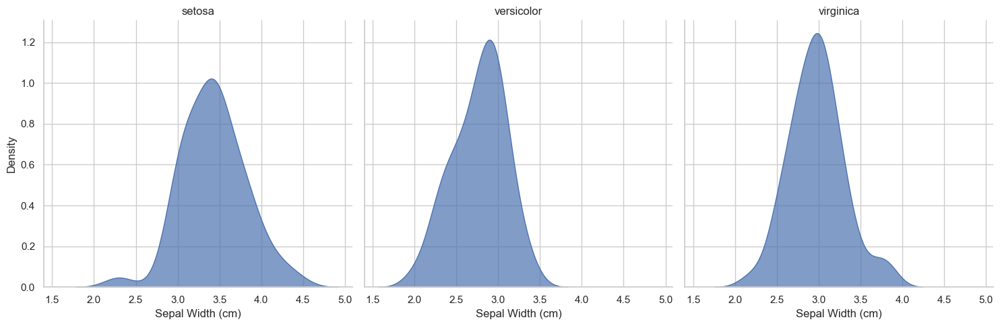

<Figure size 1200x1000 with 0 Axes>

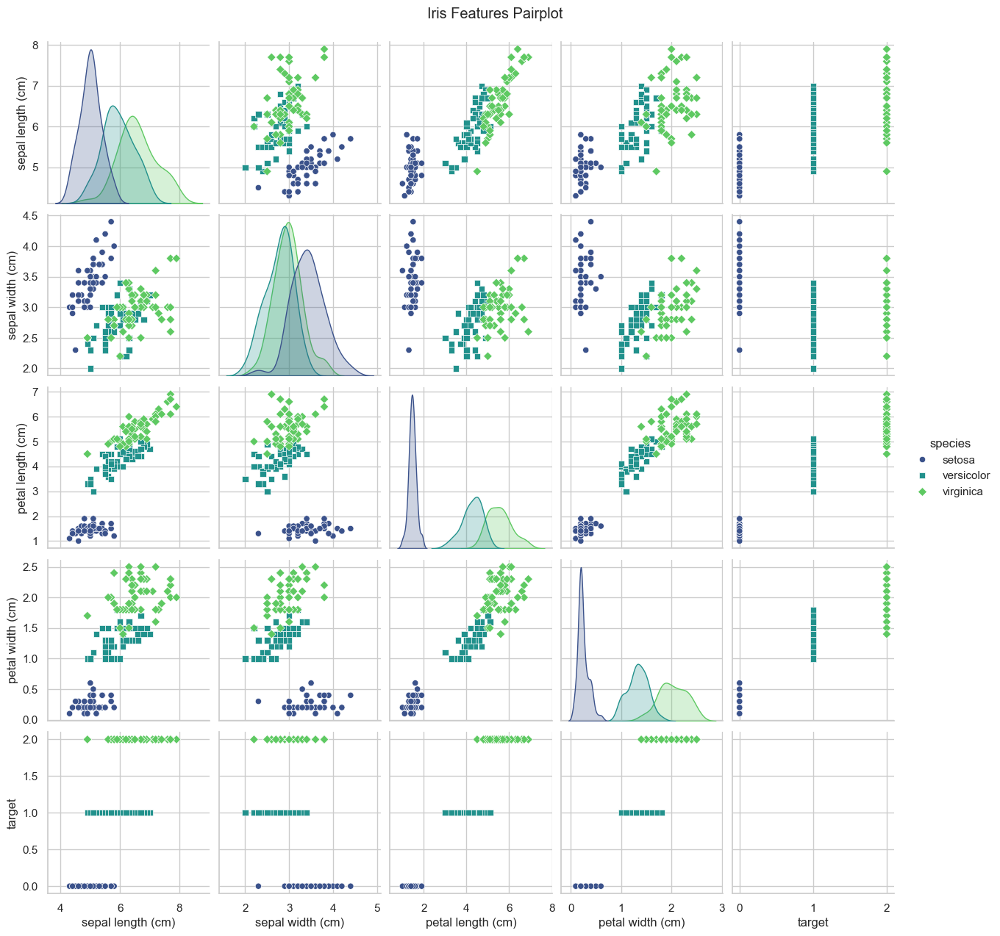

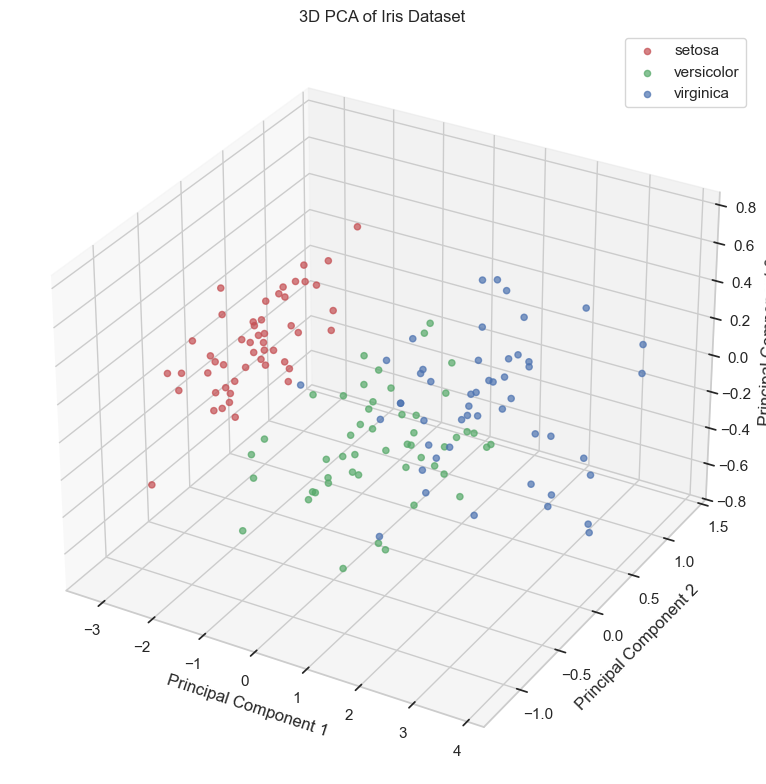

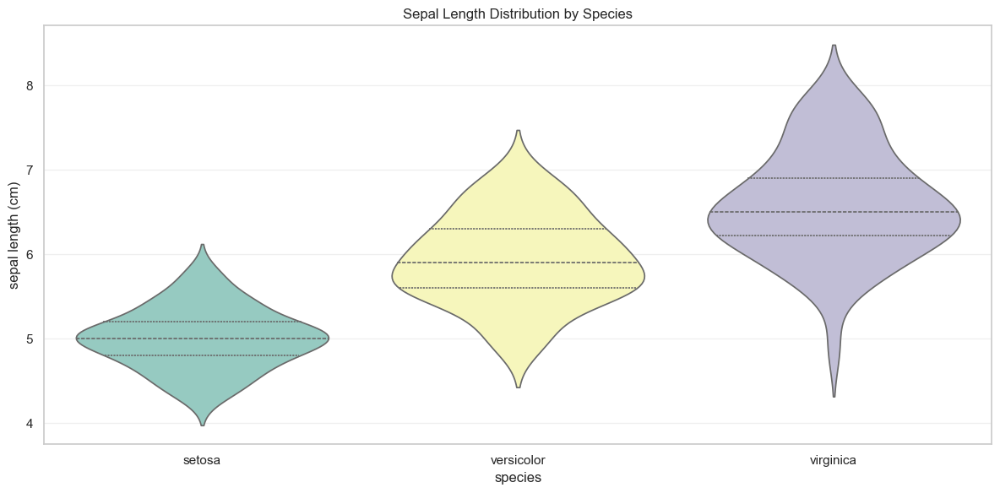

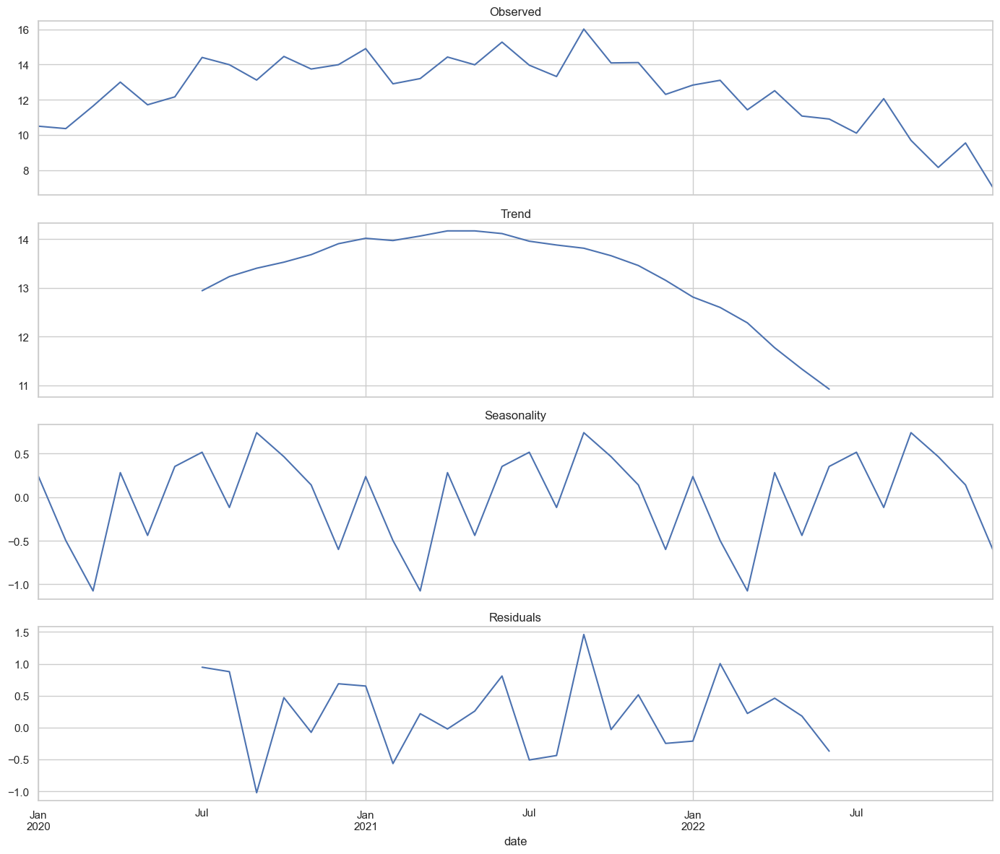

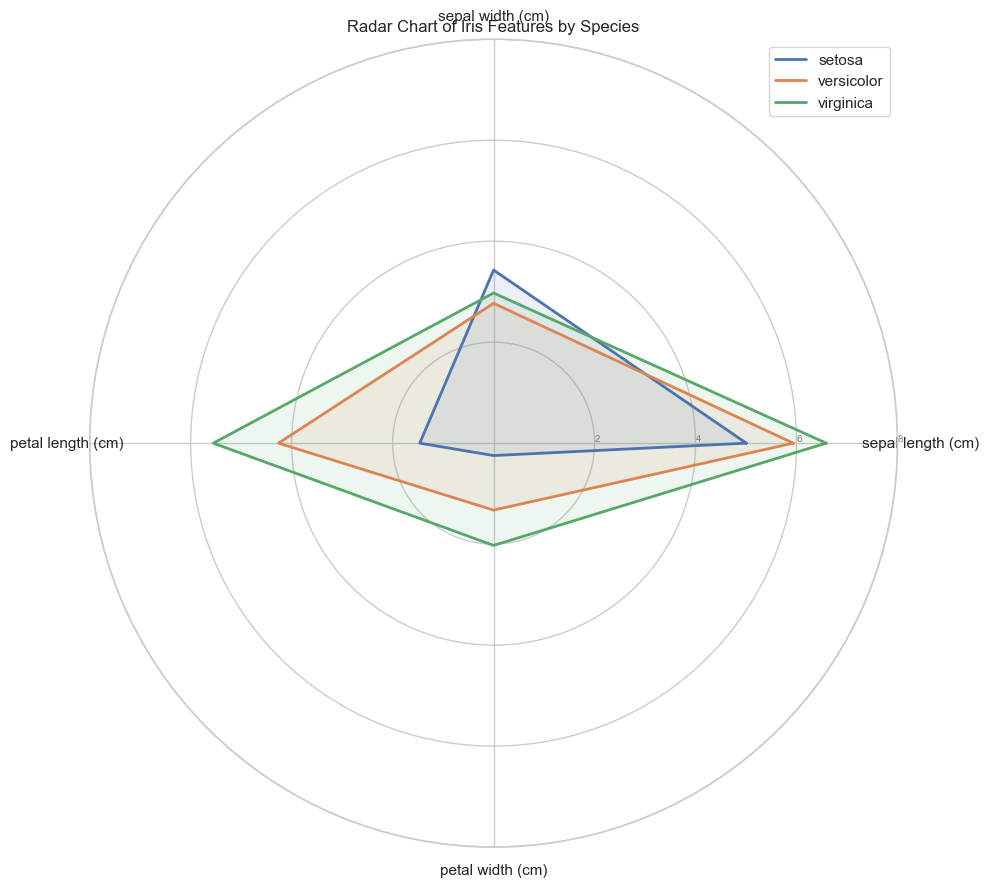

In [13]:
# Advanced visualization examples
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import seaborn as sns
from sklearn.datasets import load_iris
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

# Set style
sns.set(style="whitegrid")

# Load and prepare example data
iris = load_iris()
iris_df = pd.DataFrame(data=np.c_[iris['data'], iris['target']],
                      columns=iris['feature_names'] + ['target'])
iris_df['species'] = iris_df['target'].map({0: 'setosa', 1: 'versicolor', 2: 'virginica'})

# Generate time series data
np.random.seed(42)
date_rng = pd.date_range(start='2020-01-01', end='2022-12-31', freq='ME')  # FIXED: 'M' -> 'ME'
time_series_data = pd.DataFrame(date_rng, columns=['date'])
time_series_data['value'] = np.random.normal(10, 1, size=(len(date_rng))) + \
                           np.sin(np.arange(len(date_rng)) * 0.1) * 5
time_series_data['category'] = np.random.choice(['A', 'B', 'C'], size=len(date_rng))
time_series_data.set_index('date', inplace=True)

# 1. Facet Grid
plt.figure(figsize=(14, 8))
g = sns.FacetGrid(iris_df, col="species", height=5, aspect=1)
g.map(sns.kdeplot, "sepal width (cm)", fill=True, alpha=0.7)
g.set_titles("{col_name}")
g.set_axis_labels("Sepal Width (cm)", "Density")
plt.tight_layout()
# plt.show()

# 2. Pair Plot
plt.figure(figsize=(12, 10))
pair_plot = sns.pairplot(iris_df, hue="species", height=2.5,
                        diag_kind="kde", markers=["o", "s", "D"],
                        palette="viridis")
pair_plot.fig.suptitle("Iris Features Pairplot", y=1.02)
# plt.show()

# 3. 3D Scatter Plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Applying PCA to get 3 principal components
pca = PCA(n_components=3)
components = pca.fit_transform(iris.data)

# Get unique species and colors
unique_species = iris_df['species'].unique()
colors = ['r', 'g', 'b']

for i, species in enumerate(unique_species):
    is_species = iris_df['species'] == species
    ax.scatter(components[is_species.values, 0], 
               components[is_species.values, 1], 
               components[is_species.values, 2], 
               c=colors[i], label=species, alpha=0.7)

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D PCA of Iris Dataset')
ax.legend()
plt.tight_layout()
# plt.show()

# 4. Violin Plot
plt.figure(figsize=(12, 6))
sns.violinplot(x="species", y="sepal length (cm)", data=iris_df,
               hue="species", palette="Set3", inner="quartile", legend=False)  # FIXED
plt.title('Sepal Length Distribution by Species')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
# plt.show()

# 5. Time Series Decomposition
from statsmodels.tsa.seasonal import seasonal_decompose

decomposition = seasonal_decompose(time_series_data['value'], model='additive', period=12)

fig, axes = plt.subplots(4, 1, figsize=(14, 12), sharex=True)
decomposition.observed.plot(ax=axes[0], legend=False)
axes[0].set_title('Observed')
decomposition.trend.plot(ax=axes[1], legend=False)
axes[1].set_title('Trend')
decomposition.seasonal.plot(ax=axes[2], legend=False)
axes[2].set_title('Seasonality')
decomposition.resid.plot(ax=axes[3], legend=False)
axes[3].set_title('Residuals')
plt.tight_layout()
# plt.show()

# 6. Radar Chart
from math import pi

radar_df = iris_df.groupby('species').mean().drop('target', axis=1)
categories = list(radar_df.columns)
N = len(categories)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

fig = plt.figure(figsize=(10, 10))
ax = plt.subplot(111, polar=True)

for i, species in enumerate(radar_df.index):
    values = radar_df.loc[species].values.tolist()
    values += values[:1]
    ax.plot(angles, values, linewidth=2, linestyle='solid', label=species)
    ax.fill(angles, values, alpha=0.1)

plt.xticks(angles[:-1], categories)
ax.set_rlabel_position(0)
plt.yticks([2, 4, 6, 8], ["2", "4", "6", "8"], color="grey", size=7)
plt.ylim(0, 8)
plt.legend(loc='upper right')
plt.title('Radar Chart of Iris Features by Species')
plt.tight_layout()
# plt.show()

### 4.3 Interactive Visualizations

Interactive visualizations allow users to explore data dynamically.

In [14]:
# Interactive visualization example with Plotly
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import pandas as pd
from sklearn.datasets import load_iris

# Load and prepare example data
iris = load_iris()
iris_df = pd.DataFrame(data=iris.data, columns=iris.feature_names)
iris_df['species'] = [iris.target_names[i] for i in iris.target]

# Create a scatter plot matrix
fig = px.scatter_matrix(
    iris_df,
    dimensions=iris.feature_names,
    color="species",
    title="Iris Dataset Scatter Matrix",
    labels={col: col.replace("(cm)", "").strip() for col in iris.feature_names},
    height=800,
)

fig.update_traces(diagonal_visible=False, showupperhalf=False)
# fig.show()

# Create a 3D scatter plot
fig_3d = px.scatter_3d(
    iris_df,
    x='sepal length (cm)',
    y='sepal width (cm)',
    z='petal length (cm)',
    color='species',
    size='petal width (cm)',
    hover_data=['petal width (cm)'],
    title="Iris Dataset 3D Visualization",
    height=800
)
# fig_3d.show()

# Create an interactive dashboard with subplots
from plotly.subplots import make_subplots

# Create subplot figure
fig_dashboard = make_subplots(
    rows=2, cols=2,
    specs=[
        [{"type": "scatter"}, {"type": "histogram"}],
        [{"type": "box", "colspan": 2}, None]
    ],
    subplot_titles=("Sepal Width vs Length", "Petal Length Distribution", 
                   "Feature Box Plots by Species"),
    vertical_spacing=0.1
)

# Add scatter plot
fig_dashboard.add_trace(
    go.Scatter(
        x=iris_df['sepal length (cm)'],
        y=iris_df['sepal width (cm)'],
        mode='markers',
        marker=dict(
            color=iris.target,
            colorscale='Viridis',
            showscale=True,
            colorbar=dict(title="Species")
        ),
        text=iris_df['species'],
        name='Sepal Dimensions'
    ),
    row=1, col=1
)

# Add histogram
for i, species in enumerate(iris_df['species'].unique()):
    fig_dashboard.add_trace(
        go.Histogram(
            x=iris_df[iris_df['species'] == species]['petal length (cm)'],
            name=species,
            opacity=0.7
        ),
        row=1, col=2
    )

# Add box plots
for feature in iris.feature_names:
    fig_dashboard.add_trace(
        go.Box(
            y=iris_df[feature],
            x=iris_df['species'],
            name=feature,
            boxmean=True
        ),
        row=2, col=1
    )

fig_dashboard.update_layout(
    title_text="Interactive Iris Dataset Dashboard",
    height=800,
    showlegend=False,
)

# Update xaxis properties
fig_dashboard.update_xaxes(title_text="Sepal Length (cm)", row=1, col=1)
fig_dashboard.update_yaxes(title_text="Sepal Width (cm)", row=1, col=1)
fig_dashboard.update_xaxes(title_text="Petal Length (cm)", row=1, col=2)
fig_dashboard.update_yaxes(title_text="Count", row=1, col=2)
fig_dashboard.update_xaxes(title_text="Species", row=2, col=1)
fig_dashboard.update_yaxes(title_text="Value (cm)", row=2, col=1)

# fig_dashboard.show()

## 5. Deep Learning

Deep learning uses neural networks with multiple layers to progressively extract higher-level features from raw input.

### 5.1 Introduction to Deep Learning

Deep learning is a subset of machine learning that employs multi-layered neural networks to learn from large amounts of data.

Test accuracy: 0.9722
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


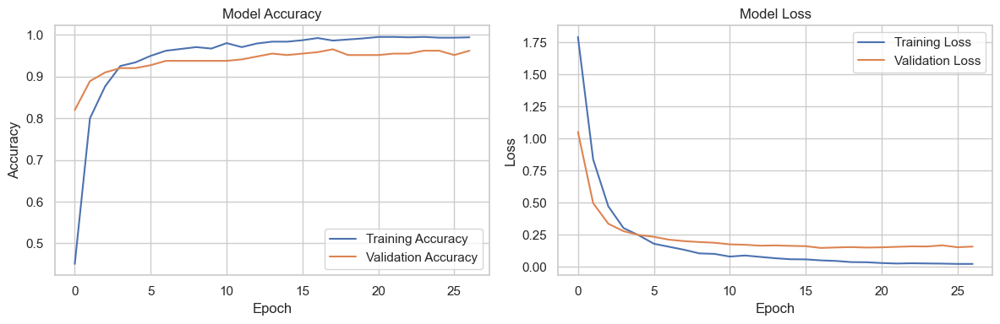

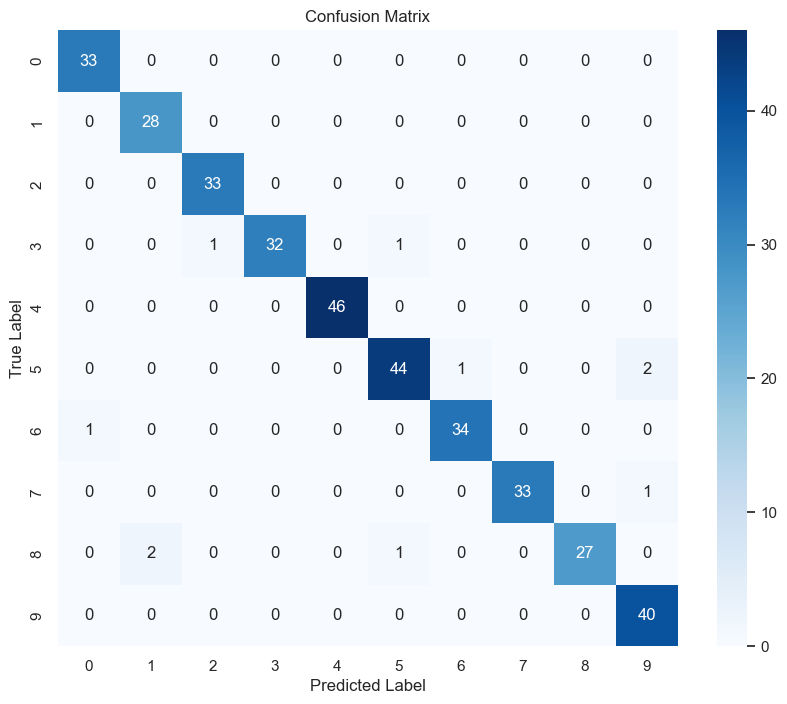

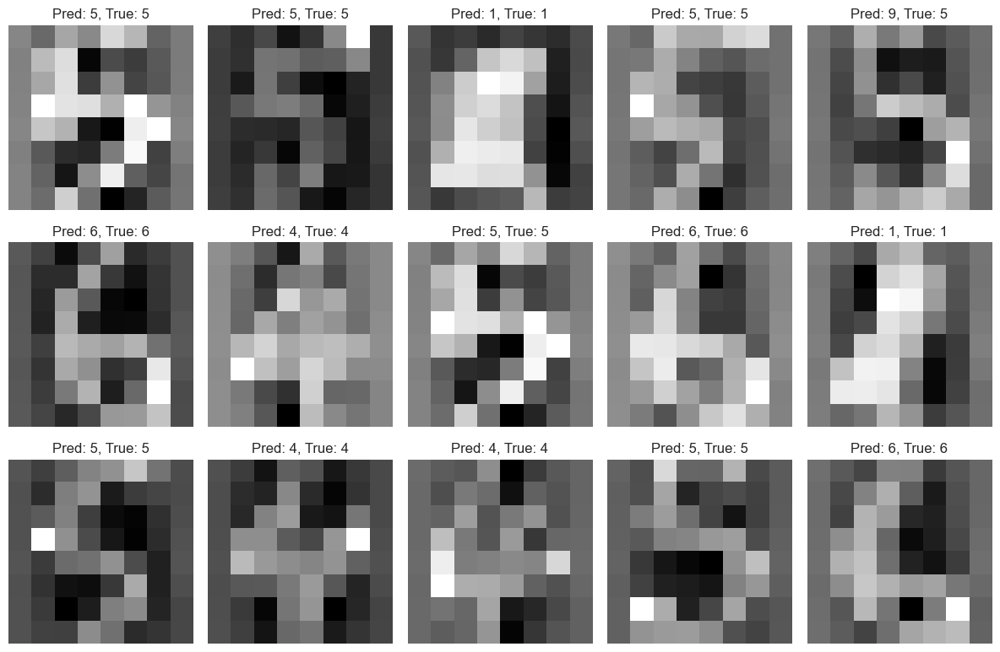

In [15]:
# Deep learning basics with TensorFlow/Keras
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_digits
import pandas as pd

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Load and prepare data
digits = load_digits()
X = digits.data
y = digits.target

# Normalize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Convert labels to one-hot encoding
y_categorical = to_categorical(y)

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_categorical, test_size=0.2, random_state=42)

# Define the model with Input layer as first layer
model = Sequential([
    Input(shape=(X_train.shape[1],)),  # Proper input layer
    Dense(128, activation='relu'),
    Dropout(0.2),
    Dense(64, activation='relu'),
    Dropout(0.2),
    Dense(10, activation='softmax')
])

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Define callbacks, save model in native Keras format (.keras)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_accuracy', save_best_only=True)

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stopping, model_checkpoint],
    verbose=0
)

# Evaluate the model
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test accuracy: {test_accuracy:.4f}")

# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
# plt.show()

# Generate predictions
predictions = model.predict(X_test)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(y_test, axis=1)

# Create a confusion matrix
from sklearn.metrics import confusion_matrix
import seaborn as sns

conf_matrix = confusion_matrix(true_classes, predicted_classes)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
# plt.show()

# Visualize some predictions
plt.figure(figsize=(12, 8))
for i in range(15):
    plt.subplot(3, 5, i+1)
    sample_idx = np.random.randint(0, len(X_test))
    image = X_test[sample_idx].reshape(8, 8)
    plt.imshow(image, cmap='gray')
    pred_class = np.argmax(predictions[sample_idx])
    true_class = np.argmax(y_test[sample_idx])
    plt.title(f"Pred: {pred_class}, True: {true_class}")
    plt.axis('off')

plt.tight_layout()
# plt.show()

### 5.2 Convolutional Neural Networks

CNNs are specialized neural networks particularly effective for image processing and computer vision.

In [53]:
# # CNN example with TensorFlow/Keras
# import tensorflow as tf
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
# from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
# from tensorflow.keras.callbacks import EarlyStopping
# from tensorflow.keras.datasets import cifar10
# import numpy as np
# import matplotlib.pyplot as plt

# # Set random seeds for reproducibility
# np.random.seed(42)
# tf.random.set_seed(42)

# # Load and prepare data
# (X_train, y_train), (X_test, y_test) = cifar10.load_data()

# # Normalize pixel values
# X_train = X_train / 255.0
# X_test = X_test / 255.0

# # Define class names
# class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 
#                'dog', 'frog', 'horse', 'ship', 'truck']

# # Display some sample images
# plt.figure(figsize=(10, 10))
# for i in range(16):
#     plt.subplot(4, 4, i+1)
#     plt.imshow(X_train[i])
#     plt.title(class_names[y_train[i][0]])
#     plt.axis('off')
# plt.tight_layout()
# # plt.show()

# # Data augmentation
# datagen = ImageDataGenerator(
#     rotation_range=15,
#     width_shift_range=0.1,
#     height_shift_range=0.1,
#     horizontal_flip=True,
#     zoom_range=0.1
# )
# datagen.fit(X_train)

# # Define CNN model
# model = Sequential([
#     # First convolutional layer
#     Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
#     Conv2D(32, (3, 3), activation='relu'),
#     MaxPooling2D(pool_size=(2, 2)),
#     Dropout(0.25),
    
#     # Second convolutional layer
#     Conv2D(64, (3, 3), activation='relu', padding='same'),
#     Conv2D(64, (3, 3), activation='relu'),
#     MaxPooling2D(pool_size=(2, 2)),
#     Dropout(0.25),
    
#     # Third convolutional layer
#     Conv2D(128, (3, 3), activation='relu', padding='same'),
#     Conv2D(128, (3, 3), activation='relu'),
#     MaxPooling2D(pool_size=(2, 2)),
#     Dropout(0.25),
    
#     # Fully connected layers
#     Flatten(),
#     Dense(512, activation='relu'),
#     Dropout(0.5),
#     Dense(10, activation='softmax')
# ])

# # Compile model
# model.compile(
#     optimizer=Adam(learning_rate=0.0001),
#     loss='sparse_categorical_crossentropy',
#     metrics=['accuracy']
# )

# # Define callbacks
# early_stopping = EarlyStopping(
#     monitor='val_accuracy',
#     patience=10,
#     restore_best_weights=True
# )

# # Train the model (in a real scenario, use more epochs)
# history = model.fit(
#     datagen.flow(X_train, y_train, batch_size=64),
#     steps_per_epoch=len(X_train) // 64,
#     epochs=2,  # Use more epochs in practice (e.g., 50)
#     validation_data=(X_test, y_test),
#     callbacks=[early_stopping],
#     verbose=1
# )

# # Evaluate the model
# test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
# print(f"Test accuracy: {test_accuracy:.4f}")

# # Make predictions
# predictions = model.predict(X_test)
# predicted_classes = np.argmax(predictions, axis=1)

# # Show some predictions
# plt.figure(figsize=(12, 12))
# for i in range(16):
#     plt.subplot(4, 4, i+1)
#     plt.imshow(X_test[i])
#     plt.title(f"Pred: {class_names[predicted_classes[i]]}\nTrue: {class_names[y_test[i][0]]}")
#     plt.axis('off')
# plt.tight_layout()
# # plt.show()

# # Visualize filters from the first convolutional layer
# filters, biases = model.layers[0].get_weights()
# filters_min, filters_max = filters.min(), filters.max()
# filters_normalized = (filters - filters_min) / (filters_max - filters_min)

# plt.figure(figsize=(10, 10))
# for i in range(min(32, filters.shape[3])):
#     plt.subplot(4, 8, i+1)
#     # Display the filter
#     plt.imshow(filters_normalized[:, :, :, i].squeeze())
#     plt.axis('off')
# plt.suptitle('CNN First Layer Filters')
# plt.tight_layout()
# # plt.show()

```
UserWarning:
Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.

UserWarning:
Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.

UserWarning:
Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
```

Epoch 1/2
782/782 ━━━━━━━━━━━━━━━━━━━━ 114s 143ms/step - accuracy: 0.1795 - loss: 2.1408 - val_accuracy: 0.3603 - val_loss: 1.7097
Epoch 2/2
782/782 ━━━━━━━━━━━━━━━━━━━━ 115s 147ms/step - accuracy: 0.3486 - loss: 1.7368 - val_accuracy: 0.4461 - val_loss: 1.4918
Test accuracy: 0.4461
313/313 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step


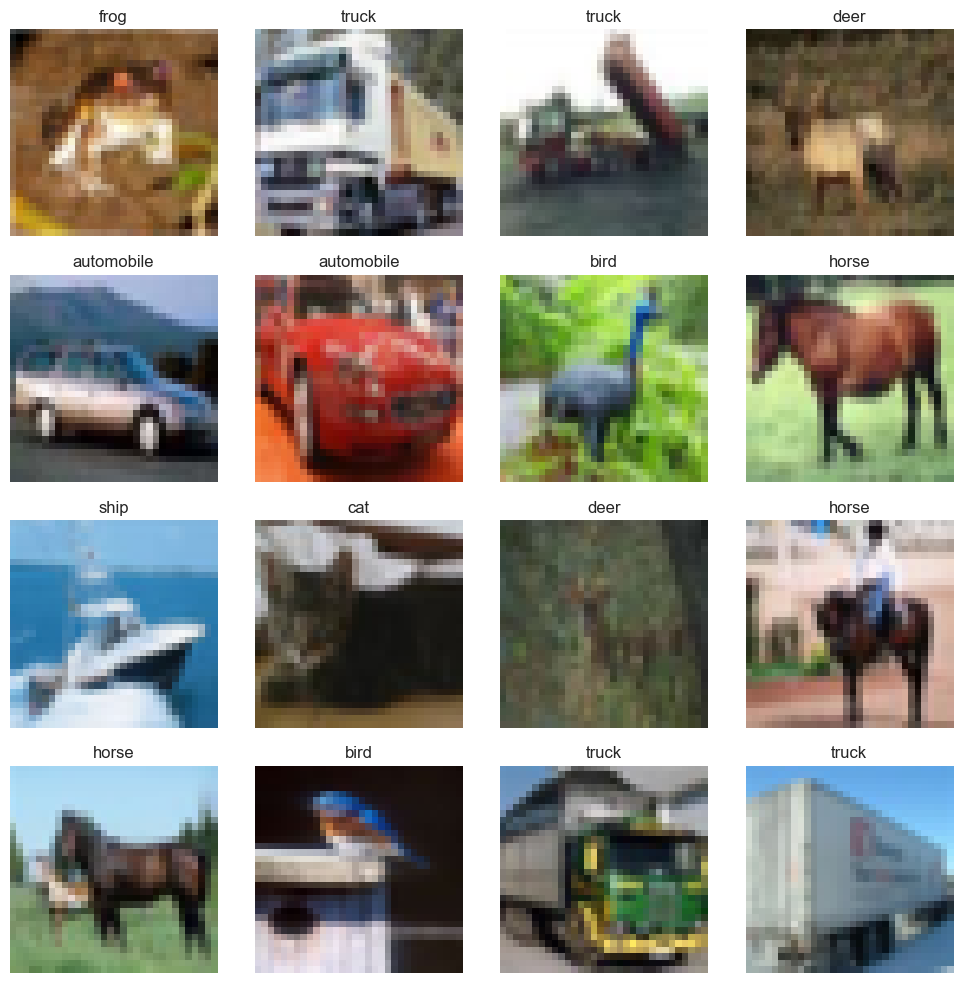

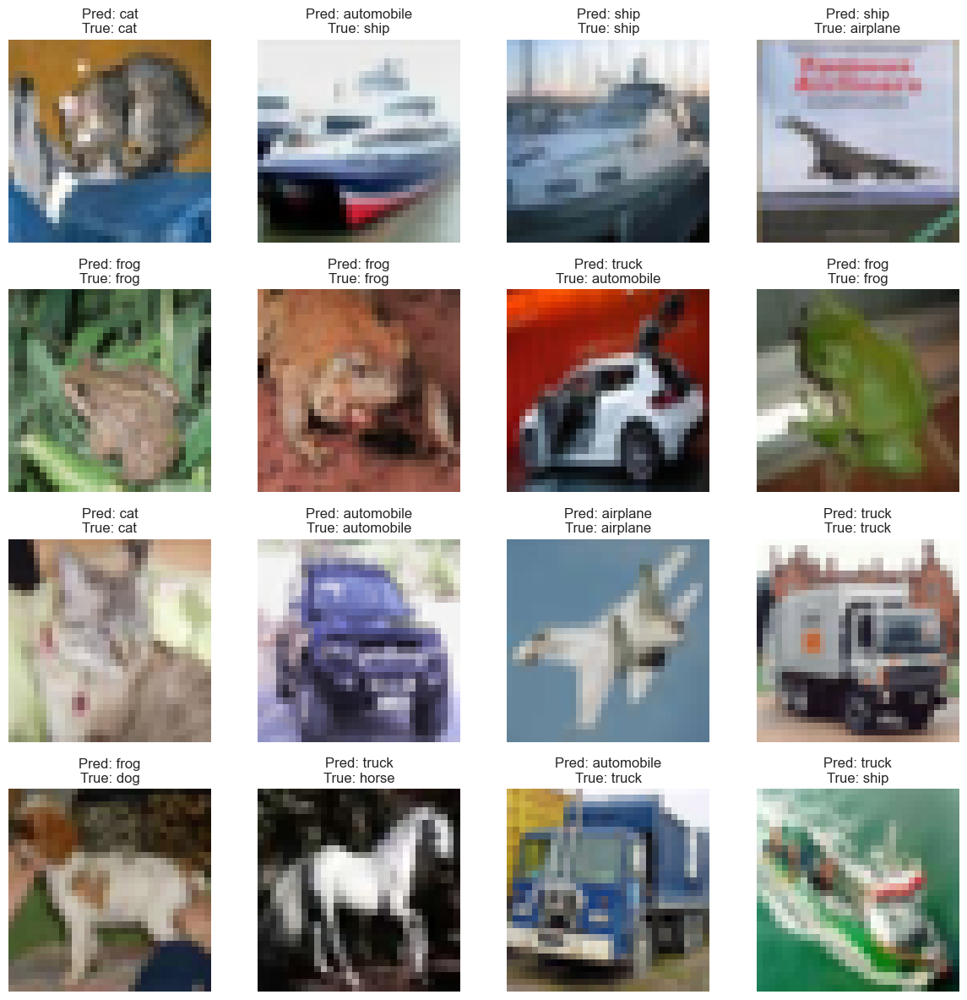

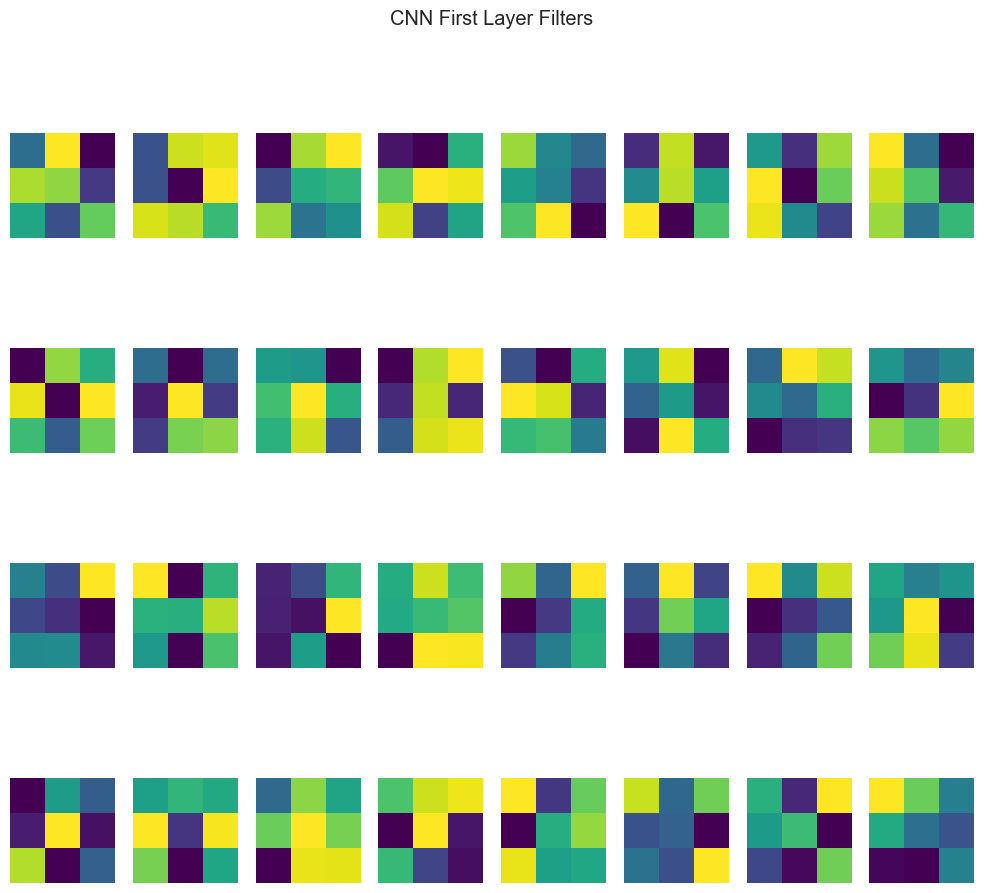

In [52]:
# CNN example with TensorFlow/Keras
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.datasets import cifar10
import numpy as np
import matplotlib.pyplot as plt
import warnings

# Suppress specific warnings
warnings.filterwarnings('ignore', message="Do not pass an `input_shape`/`input_dim` argument to a layer")
warnings.filterwarnings('ignore', message="Your `PyDataset` class should call")
warnings.filterwarnings('ignore', message="Your input ran out of data; interrupting training")

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Load and prepare data
(X_train, y_train), (X_test, y_test) = cifar10.load_data()

# Normalize pixel values
X_train = X_train / 255.0
X_test = X_test / 255.0

# Define class names
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 
               'dog', 'frog', 'horse', 'ship', 'truck']

# Display some sample images
plt.figure(figsize=(10, 10))
for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.imshow(X_train[i])
    plt.title(class_names[y_train[i][0]])
    plt.axis('off')
plt.tight_layout()
# plt.show()

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    zoom_range=0.1
)
datagen.fit(X_train)

# Define CNN model
model = Sequential([
    # First convolutional layer - keep the input_shape but suppress the warning
    Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(32, 32, 3)),
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.25),
    
    # Second convolutional layer
    Conv2D(64, (3, 3), activation='relu', padding='same'),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.25),
    
    # Third convolutional layer
    Conv2D(128, (3, 3), activation='relu', padding='same'),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.25),
    
    # Fully connected layers
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(10, activation='softmax')
])

# Compile model
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# Define callbacks
early_stopping = EarlyStopping(
    monitor='val_accuracy',
    patience=10,
    restore_best_weights=True
)

# Calculate batch size and steps properly
batch_size = 64
steps_per_epoch = len(X_train) // batch_size
if len(X_train) % batch_size != 0:
    steps_per_epoch += 1  # Add one more step if there's a partial batch

# Create a data generator
train_generator = datagen.flow(
    X_train, 
    y_train, 
    batch_size=batch_size
)

# Train the model with proper steps_per_epoch
history = model.fit(
    train_generator,
    steps_per_epoch=steps_per_epoch,  # Correctly calculate steps
    epochs=2,  # Use more epochs in practice (e.g., 50)
    validation_data=(X_test, y_test),
    callbacks=[early_stopping],
    verbose=1
)

# Evaluate the model
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test accuracy: {test_accuracy:.4f}")

# Make predictions
predictions = model.predict(X_test)
predicted_classes = np.argmax(predictions, axis=1)

# Show some predictions
plt.figure(figsize=(12, 12))
for i in range(16):
    plt.subplot(4, 4, i+1)
    plt.imshow(X_test[i])
    plt.title(f"Pred: {class_names[predicted_classes[i]]}\nTrue: {class_names[y_test[i][0]]}")
    plt.axis('off')
plt.tight_layout()
# plt.show()

# Visualize filters from the first convolutional layer
filters, biases = model.layers[0].get_weights()
filters_min, filters_max = filters.min(), filters.max()
filters_normalized = (filters - filters_min) / (filters_max - filters_min)

# Fix the filter visualization to avoid shape error
plt.figure(figsize=(10, 10))
for i in range(min(32, filters.shape[3])):
    plt.subplot(4, 8, i+1)
    # Properly display the filter with correct dimensions
    filter_img = filters_normalized[:, :, 0, i]  # Take just the first channel for visualization
    plt.imshow(filter_img, cmap='viridis')
    plt.axis('off')
plt.suptitle('CNN First Layer Filters')
plt.tight_layout()
# plt.show()

### 5.3 Recurrent Neural Networks

RNNs are designed for sequential data, with applications in natural language processing and time series analysis.

Found 81 unique tokens.
Number of sequences: 82


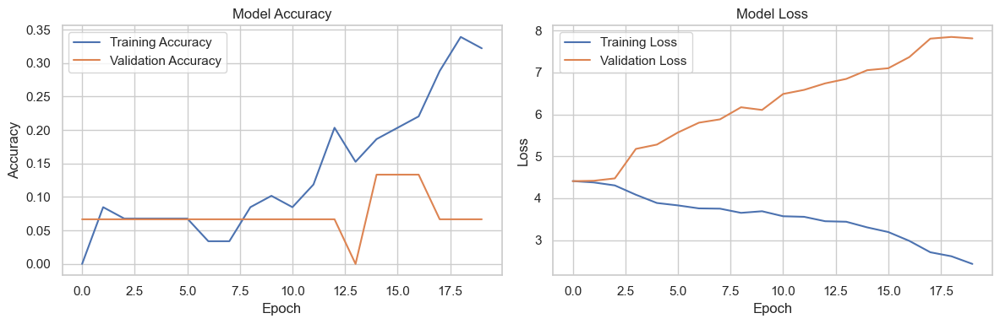

Seed: 'I love' → Next word: 'learning'
Seed: 'Neural networks' → Next word: 'are'
Seed: 'Deep learning' → Next word: 'is'
Seed: 'Natural language' → Next word: 'is'
Generated sequence: 'i love learning learning learning accessible accessible'
Generated sequence: 'neural networks are are good sequential data'
Generated sequence: 'deep learning is learning learning accessible accessible'
Generated sequence: 'natural language is language model model model'


In [17]:
# RNN for sequence prediction
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Embedding, Dropout
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import numpy as np
import matplotlib.pyplot as plt

# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Create a synthetic dataset of sentences
sentences = [
    'I love machine learning',
    'I enjoy natural language processing',
    'Deep learning is fascinating',
    'Neural networks are powerful',
    'TensorFlow makes deep learning accessible',
    'Keras is a high-level API for TensorFlow',
    'RNNs are good for sequential data',
    'LSTMs solve the vanishing gradient problem',
    'Natural language understanding is challenging',
    'Transformers have revolutionized NLP',
    'BERT is a powerful language model',
    'GPT generates human-like text',
    'Data science combines statistics and programming',
    'Feature engineering improves model performance',
    'Cross-validation prevents overfitting',
    'Hyperparameter tuning optimizes models',
    'Model deployment brings AI to production',
    'Model monitoring ensures continued performance',
    'Ethics in AI is an important consideration',
    'Explainable AI helps understand model decisions'
]

# Tokenize the sentences (Tokenizer lowercases by default)
max_words = 1000  # Maximum number of words to consider
tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts([s.lower() for s in sentences])  # lowercase here
word_index = tokenizer.word_index
print(f"Found {len(word_index)} unique tokens.")

# Create input sequences and labels with lowercase tokens
sequences = []
for sentence in sentences:
    tokens = sentence.lower().split()  # lowercase for consistency
    for i in range(1, len(tokens)):
        seq = tokens[:i+1]  # sequence includes target word at the end
        sequences.append(seq)

print(f"Number of sequences: {len(sequences)}")

X = []
y = []

for seq in sequences:
    target_word = seq[-1]
    input_words = seq[:-1]

    # Skip sequences with unknown words (should not happen now)
    if any(word not in tokenizer.word_index for word in input_words):
        continue
    if target_word not in tokenizer.word_index:
        continue

    input_seq = [tokenizer.word_index[word] for word in input_words]
    target_idx = tokenizer.word_index[target_word]

    X.append(input_seq)
    y.append(target_idx)

if not X:
    raise ValueError("No valid sequences found. Check your tokenization and data preprocessing.")

# Pad the input sequences
max_sequence_length = max(len(seq) for seq in X)
X_padded = pad_sequences(X, maxlen=max_sequence_length, padding='pre')

# Convert to numpy arrays
X_np = np.array(X_padded)
y_np = np.array(y)

# One-hot encode the output labels
y_categorical = tf.keras.utils.to_categorical(y_np, num_classes=len(word_index) + 1)

# Define the RNN model without input_length
embedding_dim = 50
model = Sequential([
    Embedding(input_dim=len(word_index) + 1, output_dim=embedding_dim),  # input_length removed
    LSTM(100),
    Dropout(0.2),
    Dense(len(word_index) + 1, activation='softmax')
])

# Compile the model
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model (few epochs for demonstration)
history = model.fit(
    X_np, y_categorical,
    epochs=20,
    batch_size=4,
    validation_split=0.2,
    verbose=0
)

# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Generate next word function
def generate_next_word(seed_text, model, tokenizer, max_sequence_length):
    # Lowercase and tokenize the seed text, ignoring unknown words
    token_list = [tokenizer.word_index[word] for word in seed_text.lower().split() if word in tokenizer.word_index]
    # Pad the sequence
    token_list = pad_sequences([token_list], maxlen=max_sequence_length, padding='pre')
    # Predict the next word probabilities
    predicted = model.predict(token_list, verbose=0)[0]
    # Get the index of the predicted word
    predicted_index = np.argmax(predicted)
    # Convert index back to word
    reverse_word_map = dict(map(reversed, tokenizer.word_index.items()))
    return reverse_word_map.get(predicted_index, "unknown")

# Test the model with some seed text
test_seeds = [
    "I love",
    "Neural networks",
    "Deep learning",
    "Natural language"
]

for seed in test_seeds:
    next_word = generate_next_word(seed, model, tokenizer, max_sequence_length)
    print(f"Seed: '{seed}' → Next word: '{next_word}'")

# Generate a complete sequence
def generate_sequence(seed_text, model, tokenizer, max_sequence_length, num_words=5):
    result = seed_text.lower().split()
    for _ in range(num_words):
        next_word = generate_next_word(' '.join(result), model, tokenizer, max_sequence_length)
        result.append(next_word)
    return ' '.join(result)

# Test sequence generation
for seed in test_seeds:
    sequence = generate_sequence(seed, model, tokenizer, max_sequence_length)
    print(f"Generated sequence: '{sequence}'")

## 6. Neural Networks

Neural networks are computational models inspired by the human brain that form the foundation of modern deep learning. They consist of interconnected nodes (neurons) organized in layers that process and transform data.

### 6.1 Basic Components of Neural Networks

Neural networks consist of:
- **Input Layer**: Receives raw data
- **Hidden Layers**: Process information through weighted connections
- **Output Layer**: Produces the final result
- **Weights & Biases**: Parameters adjusted during learning
- **Activation Functions**: Introduce non-linearity

In [18]:
import numpy as np

class SimpleNeuralNetwork:
    def __init__(self, input_size, hidden_size, output_size):
        # Initialize weights and biases
        self.W1 = np.random.randn(input_size, hidden_size) * 0.01
        self.b1 = np.zeros((1, hidden_size))
        self.W2 = np.random.randn(hidden_size, output_size) * 0.01
        self.b2 = np.zeros((1, output_size))
    
    def sigmoid(self, x):
        return 1 / (1 + np.exp(-x))
    
    def sigmoid_derivative(self, x):
        return x * (1 - x)
    
    def forward(self, X):
        # Forward pass
        self.z1 = np.dot(X, self.W1) + self.b1
        self.a1 = self.sigmoid(self.z1)
        self.z2 = np.dot(self.a1, self.W2) + self.b2
        self.a2 = self.sigmoid(self.z2)
        return self.a2
    
    def backward(self, X, y, learning_rate=0.1):
        # Backward pass
        m = X.shape[0]
        
        # Calculate gradients
        dz2 = self.a2 - y
        dW2 = np.dot(self.a1.T, dz2) / m
        db2 = np.sum(dz2, axis=0, keepdims=True) / m
        
        dz1 = np.dot(dz2, self.W2.T) * self.sigmoid_derivative(self.a1)
        dW1 = np.dot(X.T, dz1) / m
        db1 = np.sum(dz1, axis=0, keepdims=True) / m
        
        # Update parameters
        self.W2 -= learning_rate * dW2
        self.b2 -= learning_rate * db2
        self.W1 -= learning_rate * dW1
        self.b1 -= learning_rate * db1
    
    def train(self, X, y, epochs=10000, learning_rate=0.1):
        for i in range(epochs):
            # Forward and backward pass
            self.forward(X)
            self.backward(X, y, learning_rate)
            
            # Print loss every 1000 epochs
            if i % 1000 == 0:
                loss = np.mean(np.square(y - self.a2))
                print(f"Epoch {i}, Loss: {loss}")

### 6.2 Types of Neural Networks

#### 6.2.1 Feedforward Neural Networks

The most basic type where information flows in one direction from input to output.

#### 6.2.2 Convolutional Neural Networks (CNNs)

Specialized for processing grid-like data such as images.

In [55]:
# import tensorflow as tf
# from tensorflow.keras import layers, models

# # Creating a simple feedforward neural network
# model = models.Sequential([
#     layers.Dense(128, activation='relu', input_shape=(784,)),
#     layers.Dropout(0.2),
#     layers.Dense(64, activation='relu'),
#     layers.Dropout(0.2),
#     layers.Dense(10, activation='softmax')
# ])

# model.compile(optimizer='adam',
#               loss='sparse_categorical_crossentropy',
#               metrics=['accuracy'])

# model.summary()

```
UserWarning:
Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
```

In [56]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Creating a simple feedforward neural network with Input layer
model = models.Sequential([
    layers.Input(shape=(784,)),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(10, activation='softmax')
])

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_33 (Dense)                     │ (None, 128)                 │         100,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_35 (Dropout)                 │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_34 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_36 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_35 (Dense)                     │ (None, 10)                  │             650 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 109,386 (427.29 KB)

 Trainable params: 109,386 (427.29 KB)

 Non-trainable params: 0 (0.00 B)

In [59]:
# CNN model for image classification
cnn_model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(10, activation='softmax')
])

cnn_model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

cnn_model.summary()

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_51 (Conv2D)                   │ (None, 26, 26, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_27 (MaxPooling2D)      │ (None, 13, 13, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_52 (Conv2D)                   │ (None, 11, 11, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_28 (MaxPooling2D)      │ (None, 5, 5, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_53 (Conv2D)                   │ (None, 3, 3, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_10 (Flatten)                 │ (None, 576)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_40 (Dense)                     │ (None, 64)                  │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_41 (Dense)                     │ (None, 10)                  │             650 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 93,322 (364.54 KB)

 Trainable params: 93,322 (364.54 KB)

 Non-trainable params: 0 (0.00 B)

#### 6.2.3 Recurrent Neural Networks (RNNs)

Designed for sequential data processing with memory capabilities.

In [64]:
# # RNN model for sequence data
# rnn_model = models.Sequential([
#     layers.Embedding(10000, 32),
#     layers.LSTM(32),
#     layers.Dense(1, activation='sigmoid')
# ])

# rnn_model.compile(optimizer='adam',
#                  loss='binary_crossentropy',
#                  metrics=['accuracy'])

# rnn_model.summary()

In [65]:
from tensorflow.keras import models, layers
import numpy as np

# Define constants
vocab_size = 10000
embedding_dim = 32
sequence_length = 100  # each input will be a sequence of 100 tokens

# Build model with input shape defined
rnn_model = models.Sequential([
    layers.Embedding(input_dim=vocab_size, output_dim=embedding_dim, input_shape=(sequence_length,)),
    layers.LSTM(32),
    layers.Dense(1, activation='sigmoid')
])

# Compile the model
rnn_model.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

# Call build explicitly OR fit once to trigger building
rnn_model.build(input_shape=(None, sequence_length))

# Print model summary
rnn_model.summary()

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding_5 (Embedding)              │ (None, 100, 32)             │         320,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 32)                  │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_45 (Dense)                     │ (None, 1)                   │              33 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 328,353 (1.25 MB)

 Trainable params: 328,353 (1.25 MB)

 Non-trainable params: 0 (0.00 B)

### 6.3 Training Neural Networks

Training neural networks involves:
- Forward propagation
- Loss calculation
- Backpropagation
- Parameter updates

Epoch 1/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.5186 - loss: 0.6952 - val_accuracy: 0.4400 - val_loss: 0.7003
Epoch 2/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5463 - loss: 0.6889 - val_accuracy: 0.4600 - val_loss: 0.6954
Epoch 3/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5516 - loss: 0.6862 - val_accuracy: 0.4800 - val_loss: 0.6964
Epoch 4/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5822 - loss: 0.6844 - val_accuracy: 0.4900 - val_loss: 0.6958
Epoch 5/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5924 - loss: 0.6821 - val_accuracy: 0.5000 - val_loss: 0.6960
Epoch 6/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6035 - loss: 0.6800 - val_accuracy: 0.4750 - val_loss: 0.6957
Epoch 7/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6111 - loss: 0.6777 - val_accuracy: 0.4650 - val_loss: 0.6957
Epoch 8/10
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6098 - loss: 0.6755 - val_accuracy: 0.4750 - val_loss

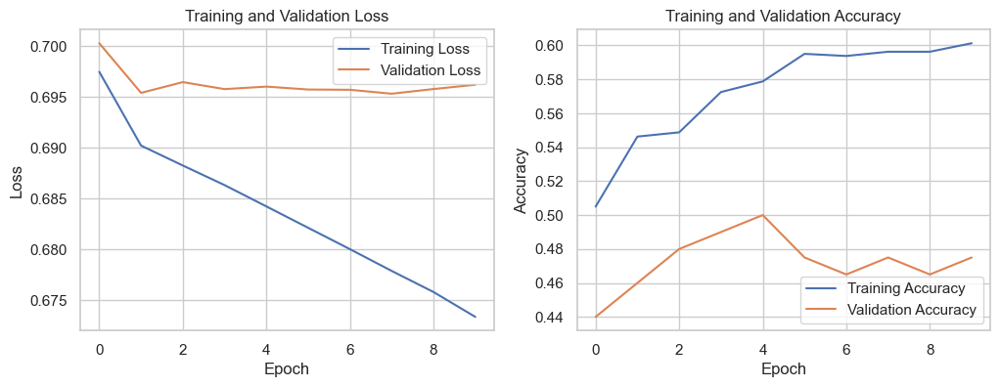

In [23]:
# Training a neural network with TensorFlow
import tensorflow as tf
import numpy as np

# Generate synthetic data
X_train = np.random.rand(1000, 20)
y_train = np.random.randint(0, 2, size=(1000, 1))

# Create and train model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(20,)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Training
history = model.fit(
    X_train, y_train,
    epochs=10,
    batch_size=32,
    validation_split=0.2,
    verbose=1
)

# Visualize training history
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

### 6.4 Neural Network Architectures and Applications

Different neural network architectures serve specific purposes:
- **CNNs**: Image classification, object detection
- **RNNs/LSTMs/GRUs**: Time series, text generation
- **Transformers**: NLP tasks, sequence-to-sequence
- **GANs**: Image generation, data synthesis
- **Autoencoders**: Dimensionality reduction, anomaly detection

## 7. Deployment Options

Model deployment is the process of making machine learning models available for use in production environments. It's a critical step in the AI-ML pipeline that bridges research and real-world applications.

### 7.1 Model Serving Architectures

#### 7.1.1 REST APIs

```python
# Flask API for model deployment
from flask import Flask, request, jsonify
import pickle
import numpy as np

app = Flask(__name__)

# Load the trained model
with open('model.pkl', 'rb') as f:
    model = pickle.load(f)

@app.route('/predict', methods=['POST'])
def predict():
    data = request.json
    features = np.array(data['features']).reshape(1, -1)
    prediction = model.predict(features).tolist()
    return jsonify({'prediction': prediction})

if __name__ == '__main__':
    app.run(debug=True, host='0.0.0.0', port=5000)
```

In [24]:
# Best practice: run Flask outside of Jupyter
# 1. Save your Flask code to a file:
#    - Name it app.py
# 2. Run it in the terminal
#    - python app.py
# 3. Then open your browser and visit
#    - http://127.0.0.1:5000/

#### 7.1.2 Batch Prediction

```python
# Batch prediction script
import pandas as pd
import pickle

def batch_predict(input_file, output_file, model_path):
    # Load model
    with open(model_path, 'rb') as f:
        model = pickle.load(f)
    
    # Load input data
    data = pd.read_csv(input_file)
    features = data.drop('id', axis=1)
    
    # Make predictions
    predictions = model.predict(features)
    
    # Save results
    results = pd.DataFrame({
        'id': data['id'],
        'prediction': predictions
    })
    results.to_csv(output_file, index=False)
    
    return f"Processed {len(predictions)} records"

# Usage
batch_predict('new_data.csv', 'predictions.csv', 'model.pkl')
```

### 7.2 Containerization with Docker

Docker containers provide a consistent environment for model deployment.

```dockerfile
# Dockerfile for ML model deployment
FROM python:3.9-slim

WORKDIR /app

COPY requirements.txt .
RUN pip install --no-cache-dir -r requirements.txt

COPY model.pkl .
COPY app.py .

EXPOSE 5000

CMD ["python", "app.py"]
```

Command to build and run the container:
```bash
# Build the Docker image
docker build -t ml-model-api .

# Run the container
docker run -p 5000:5000 ml-model-api
```

### 7.3 Cloud Deployment Options

#### 7.3.1 AWS SageMaker

```python
# AWS SageMaker deployment
import sagemaker
from sagemaker.sklearn import SKLearnModel

# Set up SageMaker session
session = sagemaker.Session()
role = sagemaker.get_execution_role()

# Create a model from the trained artifact
model = SKLearnModel(model_data='s3://my-bucket/model.tar.gz',
                     role=role,
                     entry_point='inference.py',
                     framework_version='0.23-1')

# Deploy the model to an endpoint
predictor = model.deploy(instance_type='ml.t2.medium',
                        initial_instance_count=1)

# Make a prediction
response = predictor.predict(features)
```

#### 7.3.2 Google Cloud AI Platform

```python
# Google Cloud AI Platform deployment
from google.cloud import aiplatform

# Initialize AI Platform
aiplatform.init(project='my-project')

# Upload and deploy model
model = aiplatform.Model.upload(
    display_name='my-model',
    artifact_uri='gs://my-bucket/model/',
    serving_container_image_uri='gcr.io/my-project/my-model:v1'
)

# Deploy the model
endpoint = model.deploy(
    machine_type='n1-standard-2',
    min_replica_count=1,
    max_replica_count=5
)

# Make prediction
response = endpoint.predict(instances=[features])
```

### 7.4 Model Monitoring and Maintenance

```python
# Basic model performance monitoring
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score

def monitor_model_performance(model, test_data, actual_results, threshold=0.85):
    # Get model predictions
    predictions = model.predict(test_data)
    
    # Calculate performance metrics
    accuracy = accuracy_score(actual_results, predictions)
    precision = precision_score(actual_results, predictions)
    recall = recall_score(actual_results, predictions)
    
    # Check if model performance is below threshold
    if accuracy < threshold:
        # Alert mechanism
        send_alert(f"Model accuracy ({accuracy:.4f}) below threshold {threshold}")
        
    # Log metrics
    log_metrics({
        'timestamp': pd.Timestamp.now(),
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall
    })
    
    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall
    }

def send_alert(message):
    # Implement alert mechanism (email, Slack, etc.)
    print(f"ALERT: {message}")

def log_metrics(metrics):
    # Log metrics to database or monitoring system
    print(f"Logging metrics: {metrics}")
```

### 7.5 Edge Deployment

```python
# Converting a model for TensorFlow Lite
import tensorflow as tf

# Load model
model = tf.keras.models.load_model('my_model.h5')

# Convert to TensorFlow Lite
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

# Save the TF Lite model
with open('model.tflite', 'wb') as f:
    f.write(tflite_model)

# Quantize the model for efficiency
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
quantized_model = converter.convert()

with open('model_quantized.tflite', 'wb') as f:
    f.write(quantized_model)
```

## 8. Additional Important Topics

### 8.1 Ethics and Responsible AI

AI systems can have significant impacts on society, making ethical considerations critical. Responsible AI development includes:

- **Fairness**: Ensuring AI systems don't discriminate against protected groups
- **Transparency**: Making AI systems explainable and interpretable
- **Privacy**: Protecting user data and privacy
- **Robustness**: Building systems that perform reliably under various conditions

In [25]:
# Example: Using Fairlearn to audit model fairness
import numpy as np
import pandas as pd
from sklearn.linear_model import LogisticRegression
from fairlearn.metrics import demographic_parity_difference
from fairlearn.reductions import ExponentiatedGradient, DemographicParity

# Sample dataset with sensitive attribute
X = pd.DataFrame({
    'feature1': np.random.normal(0, 1, 1000),
    'feature2': np.random.normal(0, 1, 1000)
})
y = (X['feature1'] + X['feature2'] > 0).astype(int)
sensitive_features = np.random.binomial(1, 0.3, 1000)  # Protected attribute

# Standard model
standard_model = LogisticRegression()
standard_model.fit(X, y)

# Evaluate fairness
predictions = standard_model.predict(X)
dpd = demographic_parity_difference(
    y_true=y,
    y_pred=predictions,
    sensitive_features=sensitive_features
)
print(f"Demographic parity difference: {dpd:.4f}")

# Train fair model using constraints
constraint = DemographicParity()
mitigator = ExponentiatedGradient(
    LogisticRegression(), 
    constraint
)
mitigator.fit(X, y, sensitive_features=sensitive_features)

# Check improved fairness
fair_predictions = mitigator.predict(X)
fair_dpd = demographic_parity_difference(
    y_true=y,
    y_pred=fair_predictions,
    sensitive_features=sensitive_features
)
print(f"Fair model demographic parity difference: {fair_dpd:.4f}")

Demographic parity difference: 0.0402
Fair model demographic parity difference: 0.0292


### 8.2 MLOps (Machine Learning Operations)

MLOps bridges the gap between model development and production deployment:

- **Versioning**: Tracking code, data, and model versions
- **Continuous Integration/Deployment**: Automating testing and deployment
- **Monitoring**: Tracking model performance in production
- **Governance**: Managing the ML lifecycle

In [26]:
# # Example: Model versioning with MLflow
# import mlflow
# import numpy as np
# from sklearn.model_selection import train_test_split
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.metrics import accuracy_score

# # Sample data
# X = np.random.rand(1000, 10)
# y = (X.sum(axis=1) > 5).astype(int)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# # Start MLflow tracking
# mlflow.set_experiment("demo-experiment")

# # Track experiment
# with mlflow.start_run():
#     # Log parameters
#     params = {"n_estimators": 100, "max_depth": 5, "random_state": 42}
#     mlflow.log_params(params)
    
#     # Train model
#     model = RandomForestClassifier(**params)
#     model.fit(X_train, y_train)
    
#     # Evaluate
#     y_pred = model.predict(X_test)
#     accuracy = accuracy_score(y_test, y_pred)
#     mlflow.log_metric("accuracy", accuracy)
    
#     # Log model
#     mlflow.sklearn.log_model(model, "random_forest_model")
    
#     print(f"Model trained with accuracy: {accuracy:.4f}")
#     print(f"Model and metrics logged to MLflow")

In [27]:
# Complete updated example: Model versioning with MLflow + suppress env var info warning
import os
import mlflow
import mlflow.sklearn
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Suppress environment variable logging info warning in MLflow
os.environ["MLFLOW_RECORD_ENV_VARS_IN_MODEL_LOGGING"] = "false"

# Sample data
X = np.random.rand(1000, 10)
y = (X.sum(axis=1) > 5).astype(int)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Set or create experiment
experiment_name = "demo-experiment"
mlflow.set_experiment(experiment_name)

# Track experiment
with mlflow.start_run():
    # Log parameters
    params = {"n_estimators": 100, "max_depth": 5, "random_state": 42}
    mlflow.log_params(params)
    
    # Train model
    model = RandomForestClassifier(**params)
    model.fit(X_train, y_train)
    
    # Evaluate
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    mlflow.log_metric("accuracy", accuracy)

    # Prepare input example for signature inference (using first 5 rows of test set)
    input_example = X_test[:5]
    signature = mlflow.models.infer_signature(X_test, y_pred)

    # Log model with input example and signature
    mlflow.sklearn.log_model(
        sk_model=model,
        artifact_path="random_forest_model",
        input_example=input_example,
        signature=signature
    )
    
    print(f"Model trained with accuracy: {accuracy:.4f}")
    print("Model and metrics logged to MLflow")

2025/05/17 16:33:50 INFO mlflow.tracking.fluent: Experiment with name 'demo-experiment' does not exist. Creating a new experiment.


Model trained with accuracy: 0.8250
Model and metrics logged to MLflow


### 8.3 AutoML

AutoML automates the machine learning pipeline, including:

- **Automated Feature Engineering**: Transforming raw data into useful features
- **Model Selection**: Finding the best model architecture
- **Hyperparameter Tuning**: Optimizing model parameters
- **Neural Architecture Search**: Finding optimal neural network structures

In [28]:
# Example: AutoML with AutoGluon
from autogluon.tabular import TabularDataset, TabularPredictor
import pandas as pd
from sklearn.datasets import fetch_california_housing

# Get dataset
housing = fetch_california_housing()
df = pd.DataFrame(housing.data, columns=housing.feature_names)
df['target'] = housing.target

# Split data
train_data = df.sample(frac=0.8, random_state=42)
test_data = df.drop(train_data.index)

# Train AutoML model
predictor = TabularPredictor(label='target').fit(
    train_data,
    time_limit=300  # 5 minutes
)

# Evaluate performance
performance = predictor.evaluate(test_data)
print(f"AutoML model performance: {performance}")

# Get model leaderboard
leaderboard = predictor.leaderboard(test_data)
print("\nModel leaderboard:")
print(leaderboard.head())

No path specified. Models will be saved in: "AutogluonModels\ag-20250517_143402"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.3.0
Python Version:     3.11.4
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.26100
CPU Count:          4
Memory Avail:       5.40 GB / 15.89 GB (34.0%)
Disk Space Avail:   124.86 GB / 476.18 GB (26.2%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets. Defaulting to `'medium'`...
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='experimental' : New in v1.2: Pre-trained foundation model + parallel fits. The absolute best accuracy without consideration for inference speed. Does not support GPU.
	presets='best'         : Maximize accuracy. Recommended for most users. Use in competitions and benchmarks.
	presets='high'        

[1000]	valid_set's rmse: 0.476378
[2000]	valid_set's rmse: 0.46521
[3000]	valid_set's rmse: 0.463973
[4000]	valid_set's rmse: 0.462712
[5000]	valid_set's rmse: 0.463643


	-0.4625	 = Validation score   (-root_mean_squared_error)
	7.61s	 = Training   runtime
	0.4s	 = Validation runtime
Fitting model: LightGBM ... Training model for up to 286.60s of the 286.60s of remaining time.


[1000]	valid_set's rmse: 0.451341
[2000]	valid_set's rmse: 0.448484


	-0.4481	 = Validation score   (-root_mean_squared_error)
	4.24s	 = Training   runtime
	0.12s	 = Validation runtime
Fitting model: RandomForestMSE ... Training model for up to 282.00s of the 281.99s of remaining time.
	-0.5159	 = Validation score   (-root_mean_squared_error)
	18.59s	 = Training   runtime
	0.18s	 = Validation runtime
Fitting model: CatBoost ... Training model for up to 262.79s of the 262.78s of remaining time.
	-0.4299	 = Validation score   (-root_mean_squared_error)
	140.42s	 = Training   runtime
	0.01s	 = Validation runtime
Fitting model: ExtraTreesMSE ... Training model for up to 122.31s of the 122.31s of remaining time.
	-0.5131	 = Validation score   (-root_mean_squared_error)
	5.65s	 = Training   runtime
	0.17s	 = Validation runtime
Fitting model: NeuralNetFastAI ... Training model for up to 116.04s of the 116.04s of remaining time.
	-0.522	 = Validation score   (-root_mean_squared_error)
	16.17s	 = Training   runtime
	0.03s	 = Validation runtime
Fitting model: XGB

[1000]	valid_set's rmse: 0.441155
[2000]	valid_set's rmse: 0.440427


	-0.4403	 = Validation score   (-root_mean_squared_error)
	8.76s	 = Training   runtime
	0.2s	 = Validation runtime
Fitting model: WeightedEnsemble_L2 ... Training model for up to 299.91s of the -1.12s of remaining time.
	Ensemble Weights: {'CatBoost': 0.64, 'LightGBMLarge': 0.32, 'NeuralNetTorch': 0.04}
	-0.4258	 = Validation score   (-root_mean_squared_error)
	0.02s	 = Training   runtime
	0.0s	 = Validation runtime
AutoGluon training complete, total runtime = 301.22s ... Best model: WeightedEnsemble_L2 | Estimated inference throughput: 7156.1 rows/s (1652 batch size)
TabularPredictor saved. To load, use: predictor = TabularPredictor.load("C:\Users\pavel\projects\ai-ml\0-INTRO\AutogluonModels\ag-20250517_143402")


AutoML model performance: {'root_mean_squared_error': np.float64(-0.43621065411685545), 'mean_squared_error': -0.1902797347650549, 'mean_absolute_error': -0.2818796342859573, 'r2': 0.8586318555795159, 'pearsonr': 0.9266949266771314, 'median_absolute_error': np.float64(-0.17601708602905286)}

Model leaderboard:
                 model  score_test  score_val              eval_metric  \
0  WeightedEnsemble_L2   -0.436211  -0.425760  root_mean_squared_error   
1             CatBoost   -0.437853  -0.429949  root_mean_squared_error   
2             LightGBM   -0.453116  -0.448108  root_mean_squared_error   
3        LightGBMLarge   -0.453861  -0.440271  root_mean_squared_error   
4              XGBoost   -0.460622  -0.453015  root_mean_squared_error   

   pred_time_test  pred_time_val    fit_time  pred_time_test_marginal  \
0        0.775424       0.230850  237.208258                 0.008001   
1        0.090707       0.010556  140.421700                 0.090707   
2        0.348983       

### 8.4 Reinforcement Learning

Reinforcement learning trains agents to take actions in environments to maximize rewards:

- **Key Components**: Agents, environments, states, actions, rewards
- **Algorithms**: Q-Learning, Policy Gradient, DQN, PPO
- **Applications**: Game playing, robotics, resource management, recommendation systems

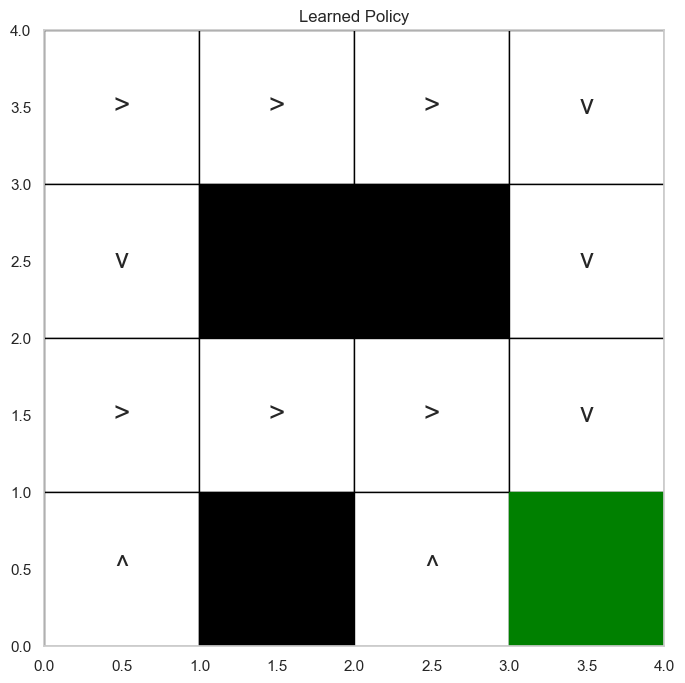

In [29]:
# Example: Simple Q-learning for grid world
import numpy as np
import matplotlib.pyplot as plt

# Define grid environment (0=empty, 1=obstacle, 2=goal)
grid = np.array([
    [0, 0, 0, 0],
    [0, 1, 1, 0],
    [0, 0, 0, 0],
    [0, 1, 0, 2]
])

# Q-learning parameters
alpha = 0.1  # Learning rate
gamma = 0.95  # Discount factor
epsilon = 0.1  # Exploration rate
num_episodes = 1000

# Initialize Q-table
q_table = np.zeros((grid.shape[0], grid.shape[1], 4))  # States x Actions

# Define actions: 0=up, 1=right, 2=down, 3=left
actions = [(0, -1), (1, 0), (0, 1), (-1, 0)]

for episode in range(num_episodes):
    # Start at random position (excluding obstacles and goal)
    valid_positions = np.where((grid == 0))
    start_idx = np.random.choice(len(valid_positions[0]))
    state = (valid_positions[0][start_idx], valid_positions[1][start_idx])
    done = False
    
    while not done:
        # Choose action using epsilon-greedy
        if np.random.uniform(0, 1) < epsilon:
            action = np.random.choice(4)  # Random action
        else:
            action = np.argmax(q_table[state[0], state[1]])  # Best action
        
        # Take action
        next_state = (state[0] + actions[action][1], state[1] + actions[action][0])
        
        # Check boundaries and obstacles
        if (next_state[0] < 0 or next_state[0] >= grid.shape[0] or
            next_state[1] < 0 or next_state[1] >= grid.shape[1] or
            grid[next_state] == 1):
            next_state = state  # Stay in place
            reward = -1  # Penalty
        elif grid[next_state] == 2:
            reward = 10  # Goal
            done = True
        else:
            reward = -0.1  # Small penalty for each step
        
        # Update Q-value
        best_next_action = np.argmax(q_table[next_state[0], next_state[1]])
        q_table[state[0], state[1], action] += alpha * (
            reward + gamma * q_table[next_state[0], next_state[1], best_next_action] - 
            q_table[state[0], state[1], action]
        )
        
        # Move to next state
        state = next_state

# Visualize policy
def visualize_policy(q_table, grid):
    policy = np.argmax(q_table, axis=2)
    arrows = ['^', '>', 'v', '<']
    fig, ax = plt.subplots(figsize=(8, 8))
    
    # Draw grid
    for i in range(grid.shape[0]):
        for j in range(grid.shape[1]):
            if grid[i, j] == 1:  # Obstacle
                ax.add_patch(plt.Rectangle((j, grid.shape[0]-i-1), 1, 1, color='black'))
            elif grid[i, j] == 2:  # Goal
                ax.add_patch(plt.Rectangle((j, grid.shape[0]-i-1), 1, 1, color='green'))
            else:  # Empty
                ax.add_patch(plt.Rectangle((j, grid.shape[0]-i-1), 1, 1, color='white', ec='black'))
                # Add arrow for policy
                action = policy[i, j]
                plt.text(j+0.5, grid.shape[0]-i-0.5, arrows[action], 
                        ha='center', va='center', fontsize=20)
    
    # Set limits and labels
    ax.set_xlim(0, grid.shape[1])
    ax.set_ylim(0, grid.shape[0])
    ax.set_title('Learned Policy')
    plt.show()

visualize_policy(q_table, grid)

### 8.5 Federated Learning

Federated Learning enables model training across decentralized devices while keeping data local:

- **Privacy Preservation**: Data remains on users' devices
- **Collaborative Learning**: Models trained across many devices
- **Reduced Data Transfer**: Only model updates are shared, not raw data

In [30]:
# # Example: Simple federated learning simulation
# import numpy as np
# from sklearn.linear_model import SGDClassifier
# from sklearn.datasets import make_classification

# # Generate sample data (simulating different clients)
# num_clients = 5
# X, y = make_classification(n_samples=1000, n_features=20, random_state=42)

# # Split data among clients
# client_data = []
# samples_per_client = len(X) // num_clients
# for i in range(num_clients):
#     start_idx = i * samples_per_client
#     end_idx = (i + 1) * samples_per_client if i < num_clients - 1 else len(X)
#     client_data.append((X[start_idx:end_idx], y[start_idx:end_idx]))

# # Initialize global model
# global_model = SGDClassifier(loss="log_loss", random_state=42)
# global_model.fit(X[:1], y[:1])  # Just to initialize coefficients

# # Federated training
# num_rounds = 5
# for round_num in range(num_rounds):
#     print(f"Round {round_num + 1}/{num_rounds}")
    
#     # Store client models
#     client_models = []
    
#     # Each client trains on their local data
#     for client_id, (client_X, client_y) in enumerate(client_data):
#         # Create client model with global parameters
#         client_model = SGDClassifier(loss="log_loss", warm_start=True, random_state=42)
#         client_model.coef_ = global_model.coef_.copy()
#         client_model.intercept_ = global_model.intercept_.copy()
        
#         # Train on local data
#         client_model.fit(client_X, client_y)
#         client_models.append(client_model)
        
#         print(f"  Client {client_id+1} trained")
    
#     # Aggregate models (simple averaging)
#     global_coef = np.mean([model.coef_ for model in client_models], axis=0)
#     global_intercept = np.mean([model.intercept_ for model in client_models], axis=0)
    
#     # Update global model
#     global_model.coef_ = global_coef
#     global_model.intercept_ = global_intercept

# # Evaluate global model
# from sklearn.metrics import accuracy_score
# accuracy = accuracy_score(y, global_model.predict(X))
# print(f"Final federated model accuracy: {accuracy:.4f}")

```
ValueError: The number of classes has to be greater than one; got 1 class
```

In [31]:
import numpy as np
from sklearn.linear_model import SGDClassifier
from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score

# Generate sample data (simulating different clients)
num_clients = 5
X, y = make_classification(n_samples=1000, n_features=20, random_state=42)

# Split data among clients
client_data = []
samples_per_client = len(X) // num_clients
for i in range(num_clients):
    start_idx = i * samples_per_client
    end_idx = (i + 1) * samples_per_client if i < num_clients - 1 else len(X)
    client_data.append((X[start_idx:end_idx], y[start_idx:end_idx]))

# Initialize global model
global_model = SGDClassifier(loss="log_loss", random_state=42)

# Prepare initialization data with at least one sample per class
classes = np.unique(y)
init_X = []
init_y = []
for c in classes:
    idx = np.where(y == c)[0][0]
    init_X.append(X[idx])
    init_y.append(y[idx])
init_X = np.array(init_X)
init_y = np.array(init_y)

global_model.fit(init_X, init_y)  # Initialize coefficients

# Federated training
num_rounds = 5
for round_num in range(num_rounds):
    print(f"Round {round_num + 1}/{num_rounds}")
    
    client_models = []
    
    for client_id, (client_X, client_y) in enumerate(client_data):
        client_model = SGDClassifier(loss="log_loss", warm_start=True, random_state=42)
        # Copy global params
        client_model.coef_ = global_model.coef_.copy()
        client_model.intercept_ = global_model.intercept_.copy()
        client_model.classes_ = global_model.classes_  # important for partial_fit
        
        # Train on local data
        client_model.fit(client_X, client_y)
        client_models.append(client_model)
        
        print(f"  Client {client_id+1} trained")
    
    # Aggregate by averaging weights
    global_coef = np.mean([model.coef_ for model in client_models], axis=0)
    global_intercept = np.mean([model.intercept_ for model in client_models], axis=0)
    
    global_model.coef_ = global_coef
    global_model.intercept_ = global_intercept

# Evaluate
accuracy = accuracy_score(y, global_model.predict(X))
print(f"Final federated model accuracy: {accuracy:.4f}")

Round 1/5
  Client 1 trained
  Client 2 trained
  Client 3 trained
  Client 4 trained
  Client 5 trained
Round 2/5
  Client 1 trained
  Client 2 trained
  Client 3 trained
  Client 4 trained
  Client 5 trained
Round 3/5
  Client 1 trained
  Client 2 trained
  Client 3 trained
  Client 4 trained
  Client 5 trained
Round 4/5
  Client 1 trained
  Client 2 trained
  Client 3 trained
  Client 4 trained
  Client 5 trained
Round 5/5
  Client 1 trained
  Client 2 trained
  Client 3 trained
  Client 4 trained
  Client 5 trained
Final federated model accuracy: 0.8650


## 9. Case Study: End-to-End ML Project

### 9.1 Problem Definition

Let's work through a complete end-to-end machine learning project to predict house prices. This will demonstrate the entire AI-ML workflow.

In [32]:
# Define project goals and success metrics
"""
Project: House Price Prediction
Goal: Create a model that accurately predicts house prices based on features
Success Metrics: 
- RMSE < $50,000
- R² > 0.80
- Model explainability for key factors affecting price
"""

'\nProject: House Price Prediction\nGoal: Create a model that accurately predicts house prices based on features\nSuccess Metrics: \n- RMSE < $50,000\n- R² > 0.80\n- Model explainability for key factors affecting price\n'

### 9.2 Data Collection and Exploration

Dataset shape: (20640, 9)

First few rows:
   MedInc  HouseAge  AveRooms  AveBedrms  Population  AveOccup  Latitude  \
0  8.3252      41.0  6.984127   1.023810       322.0  2.555556     37.88   
1  8.3014      21.0  6.238137   0.971880      2401.0  2.109842     37.86   
2  7.2574      52.0  8.288136   1.073446       496.0  2.802260     37.85   
3  5.6431      52.0  5.817352   1.073059       558.0  2.547945     37.85   
4  3.8462      52.0  6.281853   1.081081       565.0  2.181467     37.85   

   Longitude     Price  
0    -122.23  452600.0  
1    -122.22  358500.0  
2    -122.24  352100.0  
3    -122.25  341300.0  
4    -122.25  342200.0  

Summary statistics:
             MedInc      HouseAge      AveRooms     AveBedrms    Population  \
count  20640.000000  20640.000000  20640.000000  20640.000000  20640.000000   
mean       3.870671     28.639486      5.429000      1.096675   1425.476744   
std        1.899822     12.585558      2.474173      0.473911   1132.462122   
min        0.

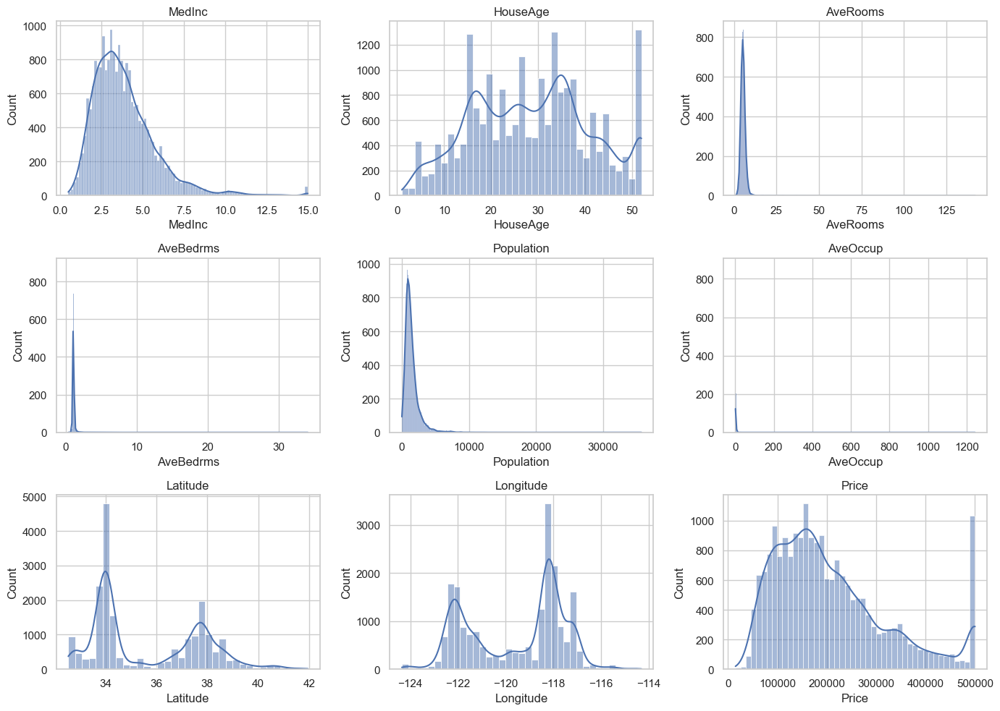

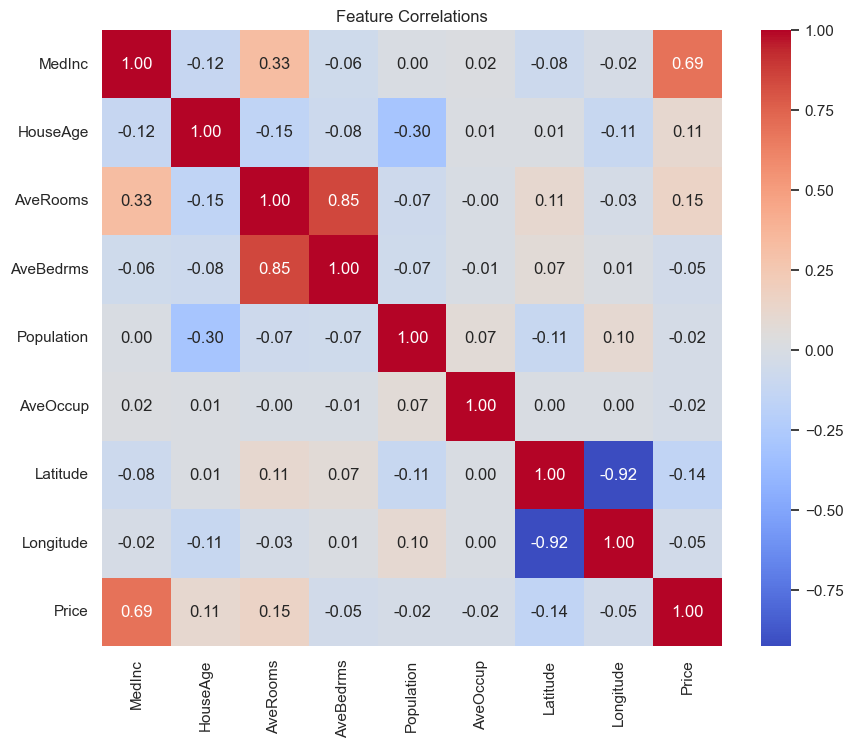

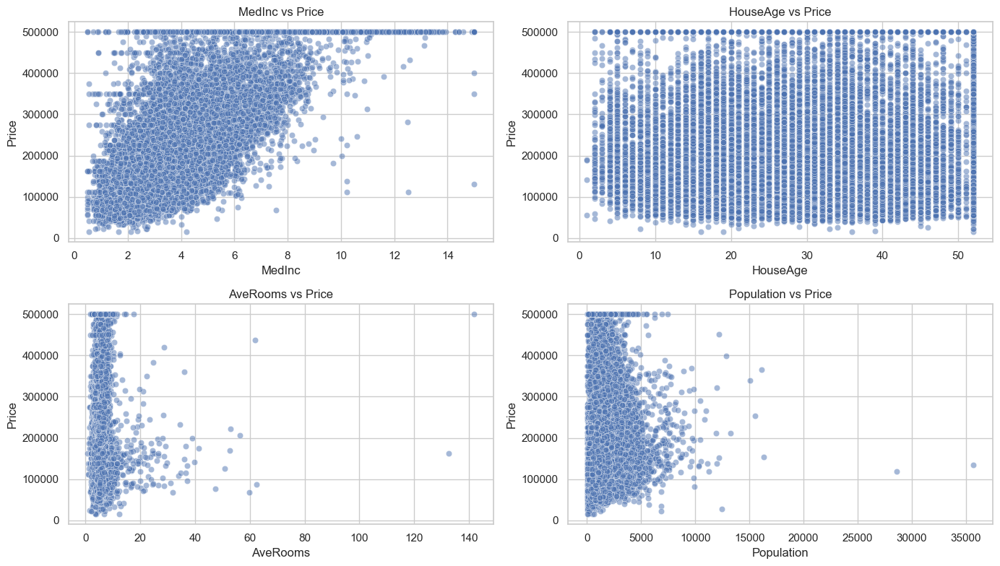

In [33]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import fetch_california_housing

# Load dataset
housing = fetch_california_housing()
df = pd.DataFrame(housing.data, columns=housing.feature_names)
df['Price'] = housing.target * 100000  # Convert to actual dollar values

# Examine data
print(f"Dataset shape: {df.shape}")
print("\nFirst few rows:")
print(df.head())

# Summary statistics
print("\nSummary statistics:")
print(df.describe())

# Check for missing values
print("\nMissing values per column:")
print(df.isnull().sum())

# Visualize data distributions
plt.figure(figsize=(14, 10))
for i, column in enumerate(df.columns):
    plt.subplot(3, 3, i+1)
    sns.histplot(df[column], kde=True)
    plt.title(column)
plt.tight_layout()
plt.show()

# Correlation matrix
plt.figure(figsize=(10, 8))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Feature Correlations')
plt.show()

# Scatter plots for key relationships
plt.figure(figsize=(14, 8))
for i, column in enumerate(['MedInc', 'HouseAge', 'AveRooms', 'Population']):
    plt.subplot(2, 2, i+1)
    sns.scatterplot(x=df[column], y=df['Price'], alpha=0.5)
    plt.title(f'{column} vs Price')
plt.tight_layout()
plt.show()

### 9.3 Data Preprocessing

In [34]:
# Preprocessing pipeline
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer

# Create synthetic categorical variable for demonstration
df['Location'] = pd.qcut(df['Latitude'], 5, labels=['North', 'North-Central', 'Central', 'South-Central', 'South'])

# Split features and target
X = df.drop('Price', axis=1)
y = df['Price']

# Split train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define feature types
numerical_features = ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup', 'Latitude', 'Longitude']
categorical_features = ['Location']

# Create preprocessing pipelines
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Preview transformed data
from sklearn.base import clone
preprocessor_fit = clone(preprocessor).fit(X_train)
X_train_processed = preprocessor_fit.transform(X_train)
print(f"Processed training data shape: {X_train_processed.shape}")

Processed training data shape: (16512, 13)


### 9.4 Model Selection and Training

Training Linear Regression...
  RMSE: 74558.14
  R²: 0.5758

Training Ridge Regression...
  RMSE: 74555.67
  R²: 0.5758

Training Lasso Regression...
  RMSE: 74558.04
  R²: 0.5758

Training Random Forest...
  RMSE: 50693.66
  R²: 0.8039

Training Gradient Boosting...
  RMSE: 54221.68
  R²: 0.7756



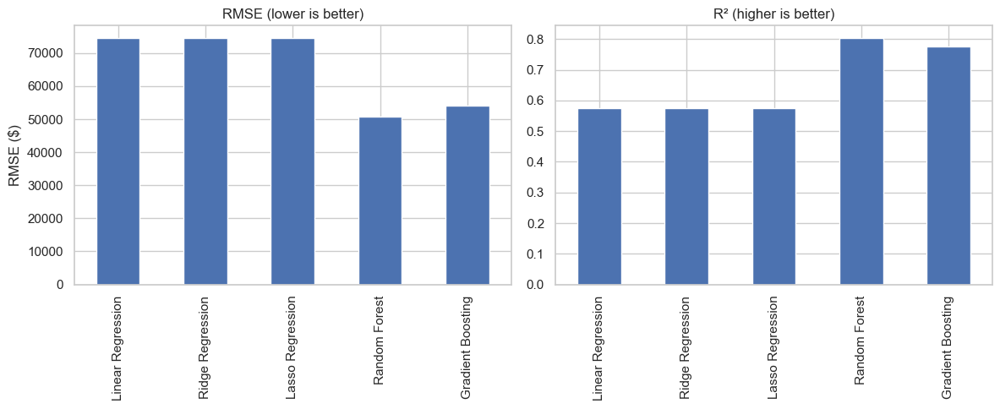

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['MedInc', 'HouseAge',
                                                   'AveRooms', 'AveBedrms',
                                                   'Population', 'AveOccup',
                                                   'Latitude',
                                                   'Longitude'])])),
                ('model', GradientBoostingRegressor(random_state=42))])

In [35]:
# Try multiple models
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Example numeric features - update with your dataset's numeric column names
numeric_features = X_train.select_dtypes(include=[np.number]).columns.tolist()

# Define preprocessor (scaling numeric features)
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        # Add categorical preprocessing here if needed
    ]
)

# Create model pipeline function
def create_model_pipeline(model):
    return Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('model', model)
    ])

# Define models to test with increased max_iter for Ridge and Lasso
models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(alpha=1.0, max_iter=10000),
    'Lasso Regression': Lasso(alpha=0.1, max_iter=10000),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42)
}

# Train and evaluate each model
results = {}
for name, model in models.items():
    print(f"Training {name}...")
    pipeline = create_model_pipeline(model)
    pipeline.fit(X_train, y_train)
    
    # Evaluate
    y_pred = pipeline.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    results[name] = {'RMSE': rmse, 'R²': r2}
    print(f"  RMSE: {rmse:.2f}")
    print(f"  R²: {r2:.4f}\n")

# Visualize model performance
performance_df = pd.DataFrame(results).T
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
performance_df['RMSE'].plot(kind='bar', ax=ax[0])
ax[0].set_title('RMSE (lower is better)')
ax[0].set_ylabel('RMSE ($)')
performance_df['R²'].plot(kind='bar', ax=ax[1])
ax[1].set_title('R² (higher is better)')
plt.tight_layout()
plt.show()

# Select best model (assuming Gradient Boosting performed best)
best_model = models['Gradient Boosting']
final_pipeline = create_model_pipeline(best_model)
final_pipeline.fit(X_train, y_train)

### 9.5 Hyperparameter Tuning

In [36]:
# # Hyperparameter tuning
# from sklearn.model_selection import GridSearchCV

# # Define parameter grid
# param_grid = {
#     'model__n_estimators': [50, 100, 200],
#     'model__learning_rate': [0.01, 0.05, 0.1],
#     'model__max_depth': [3, 4, 5]
# }

# # Create grid search
# grid_search = GridSearchCV(
#     create_model_pipeline(GradientBoostingRegressor(random_state=42)),
#     param_grid,
#     cv=5,
#     scoring='neg_root_mean_squared_error',
#     n_jobs=-1,
#     verbose=3  # Show progress during GridSearchCV
# )

# # Perform grid search
# print("Performing hyperparameter tuning...")
# grid_search.fit(X_train, y_train)

# # Best parameters and results
# print(f"\nBest parameters: {grid_search.best_params_}")
# print(f"Best RMSE: ${-grid_search.best_score_:.2f}")

# # Use best model
# tuned_model = grid_search.best_estimator_
# y_pred_tuned = tuned_model.predict(X_test)
# rmse_tuned = np.sqrt(mean_squared_error(y_test, y_pred_tuned))
# r2_tuned = r2_score(y_test, y_pred_tuned)
# print(f"Tuned model RMSE: ${rmse_tuned:.2f}")
# print(f"Tuned model R²: {r2_tuned:.4f}")

In [37]:
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import ParameterGrid, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.pipeline import Pipeline

# Assume preprocessor, X_train, y_train, X_test, y_test are already defined

# Create model pipeline function
def create_model_pipeline(model):
    return Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('model', model)
    ])

# Define parameter grid
param_grid = {
    'model__n_estimators': [50, 100, 200],
    'model__learning_rate': [0.01, 0.05, 0.1],
    'model__max_depth': [3, 4, 5]
}

param_list = list(ParameterGrid(param_grid))
best_score = -np.inf
best_params = None

print(f"Total parameter combinations: {len(param_list)}")

for i, params in enumerate(param_list, 1):
    print(f"\nTesting combination {i}/{len(param_list)}: {params}")
    
    model = create_model_pipeline(
        GradientBoostingRegressor(
            random_state=42,
            n_estimators=params['model__n_estimators'],
            learning_rate=params['model__learning_rate'],
            max_depth=params['model__max_depth']
        )
    )
    
    start = time.time()
    # 5-fold CV with RMSE (negative root mean squared error)
    scores = cross_val_score(
        model,
        X_train,
        y_train,
        cv=5,
        scoring='neg_root_mean_squared_error',
        n_jobs=-1
    )
    duration = time.time() - start
    mean_score = scores.mean()
    
    print(f"  Mean CV RMSE: {-mean_score:.2f} (took {duration:.1f} seconds)")
    
    if mean_score > best_score:
        best_score = mean_score
        best_params = params

print(f"\nBest parameters: {best_params}")
print(f"Best RMSE (CV): ${-best_score:.2f}")

# Train final tuned model on full training data
tuned_model = create_model_pipeline(
    GradientBoostingRegressor(
        random_state=42,
        n_estimators=best_params['model__n_estimators'],
        learning_rate=best_params['model__learning_rate'],
        max_depth=best_params['model__max_depth']
    )
)

tuned_model.fit(X_train, y_train)

# Evaluate tuned model on test data
y_pred_tuned = tuned_model.predict(X_test)
rmse_tuned = np.sqrt(mean_squared_error(y_test, y_pred_tuned))
r2_tuned = r2_score(y_test, y_pred_tuned)

print(f"Tuned model RMSE on test set: ${rmse_tuned:.2f}")
print(f"Tuned model R² on test set: {r2_tuned:.4f}")

Total parameter combinations: 27

Testing combination 1/27: {'model__learning_rate': 0.01, 'model__max_depth': 3, 'model__n_estimators': 50}
  Mean CV RMSE: 92975.38 (took 8.2 seconds)

Testing combination 2/27: {'model__learning_rate': 0.01, 'model__max_depth': 3, 'model__n_estimators': 100}
  Mean CV RMSE: 81129.73 (took 9.3 seconds)

Testing combination 3/27: {'model__learning_rate': 0.01, 'model__max_depth': 3, 'model__n_estimators': 200}
  Mean CV RMSE: 69827.18 (took 19.1 seconds)

Testing combination 4/27: {'model__learning_rate': 0.01, 'model__max_depth': 4, 'model__n_estimators': 50}
  Mean CV RMSE: 90798.88 (took 6.6 seconds)

Testing combination 5/27: {'model__learning_rate': 0.01, 'model__max_depth': 4, 'model__n_estimators': 100}
  Mean CV RMSE: 77493.73 (took 12.6 seconds)

Testing combination 6/27: {'model__learning_rate': 0.01, 'model__max_depth': 4, 'model__n_estimators': 200}
  Mean CV RMSE: 64613.45 (took 27.1 seconds)

Testing combination 7/27: {'model__learning_rat

### 9.6 Model Interpretation

In [38]:
# # Model interpretation with SHAP
# import shap

# # Create explainer
# explainer = shap.TreeExplainer(tuned_model['model'])
# X_processed = tuned_model['preprocessor'].transform(X_test)

# # Calculate SHAP values
# shap_values = explainer.shap_values(X_processed)

# # Get feature names after preprocessing
# feature_names = numerical_features.copy()
# cat_encoder = tuned_model['preprocessor'].transformers_[1][1]['onehot']
# for cat_feature in categorical_features:
#     cat_values = cat_encoder.categories_[0]
#     for cat_value in cat_values:
#         feature_names.append(f"{cat_feature}_{cat_value}")

# # Summary plot
# plt.figure(figsize=(10, 8))
# shap.summary_plot(
#     shap_values, 
#     X_processed,
#     feature_names=feature_names
# )
# plt.show()

# # Dependence plot for most important feature
# plt.figure(figsize=(10, 6))
# most_important_feature = 0  # Assuming MedInc is most important
# shap.dependence_plot(
#     most_important_feature, 
#     shap_values, 
#     X_processed,
#     feature_names=feature_names
# )
# plt.show()

```
AttributeError: 'str' object has no attribute 'named_steps'
```

Training Linear Regression...
  RMSE: 74410.10
  R²: 0.5775

Training Ridge Regression...
  RMSE: 74407.19
  R²: 0.5775

Training Lasso Regression...
  RMSE: 74410.03
  R²: 0.5775

Training Random Forest...
  RMSE: 50499.89
  R²: 0.8054

Training Gradient Boosting...
  RMSE: 53929.83
  R²: 0.7781



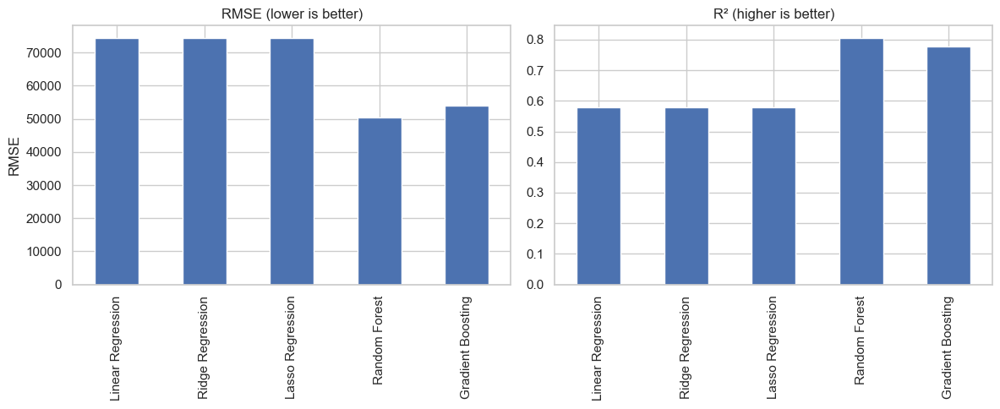

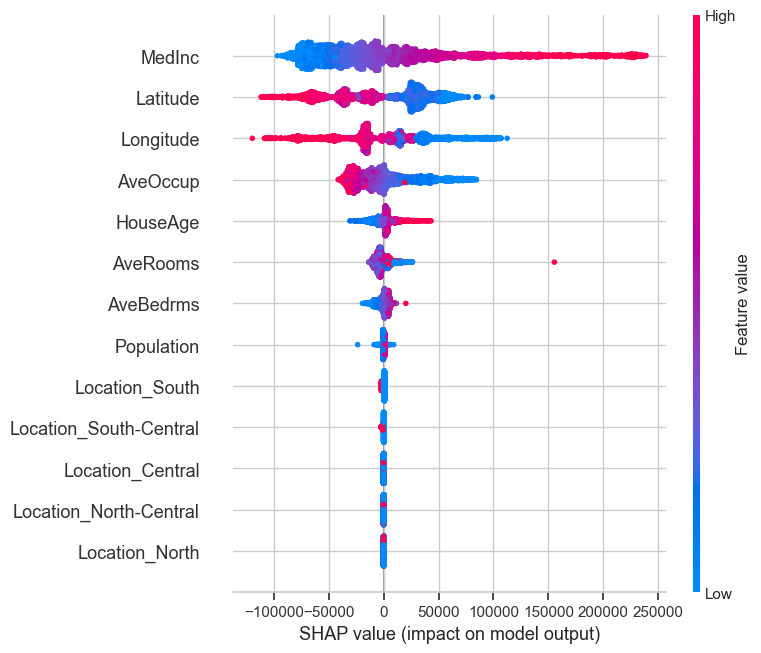

<Figure size 1000x600 with 0 Axes>

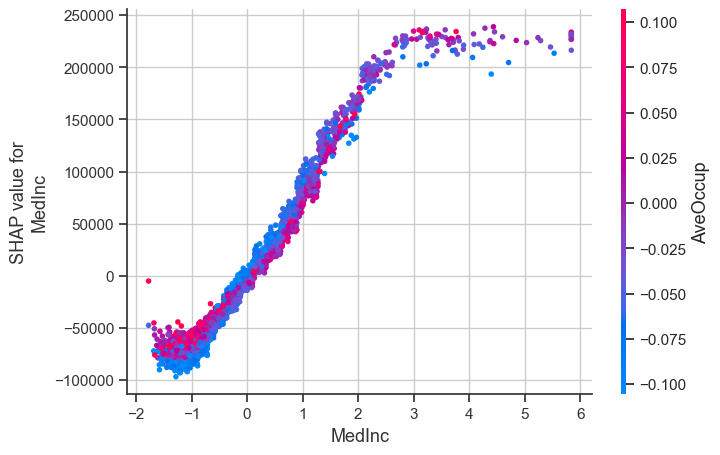

In [39]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning, message=".*global RNG was seeded.*")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

import shap

# Initialize local RNG
rng = np.random.default_rng(42)

# Example numeric and categorical features - adapt to your dataset
numeric_features = X_train.select_dtypes(include=[np.number]).columns.tolist()
categorical_features = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

# Define preprocessor with numeric scaling and categorical one-hot encoding
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features)
    ]
)

def create_model_pipeline(model):
    return Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('model', model)
    ])

# Define models with explicit random_state or random generator where supported
models = {
    'Linear Regression': LinearRegression(),
    'Ridge Regression': Ridge(alpha=1.0, max_iter=10000, random_state=42),
    'Lasso Regression': Lasso(alpha=0.1, max_iter=10000, random_state=42),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42)
}

# Train and evaluate models
results = {}
for name, model in models.items():
    print(f"Training {name}...")
    pipeline = create_model_pipeline(model)
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    results[name] = {'RMSE': rmse, 'R²': r2}
    print(f"  RMSE: {rmse:.2f}")
    print(f"  R²: {r2:.4f}\n")

# Visualize performance
performance_df = pd.DataFrame(results).T
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
performance_df['RMSE'].plot(kind='bar', ax=ax[0])
ax[0].set_title('RMSE (lower is better)')
ax[0].set_ylabel('RMSE')
performance_df['R²'].plot(kind='bar', ax=ax[1])
ax[1].set_title('R² (higher is better)')
plt.tight_layout()
plt.show()

# Choose best model (e.g., Gradient Boosting)
best_model = models['Gradient Boosting']
final_pipeline = create_model_pipeline(best_model)
final_pipeline.fit(X_train, y_train)

# SHAP interpretation
explainer = shap.TreeExplainer(final_pipeline.named_steps['model'])

# Transform X_test with preprocessor (returns numpy array)
X_processed = final_pipeline.named_steps['preprocessor'].transform(X_test)

# Get feature names after preprocessing
feature_names = numeric_features.copy()

# Extract one-hot encoder from pipeline
cat_encoder = final_pipeline.named_steps['preprocessor'].named_transformers_['cat']
onehot = cat_encoder

# Add categorical feature names expanded with categories
for cat_feature, categories in zip(categorical_features, onehot.categories_):
    for cat_val in categories:
        feature_names.append(f"{cat_feature}_{cat_val}")

# Calculate SHAP values
shap_values = explainer.shap_values(X_processed)

# Summary plot
plt.figure(figsize=(10, 8))
shap.summary_plot(shap_values, X_processed, feature_names=feature_names)
plt.show()

# Dependence plot for most important feature (index 0 here)
plt.figure(figsize=(10, 6))
shap.dependence_plot(0, shap_values, X_processed, feature_names=feature_names)
plt.show()

### 9.7 Model Deployment

In [40]:
# Save model for deployment
import joblib

# Save final model
joblib.dump(tuned_model, 'house_price_model.pkl')

# Create simple prediction function
def predict_price(features_dict):
    """
    Predict house price from feature dictionary
    
    Parameters:
    -----------
    features_dict: dict
        Dictionary with features (must match model features)
        
    Returns:
    --------
    float
        Predicted house price
    """
    # Convert to DataFrame
    features_df = pd.DataFrame([features_dict])
    
    # Ensure all required columns exist
    for col in X.columns:
        if col not in features_df.columns:
            features_df[col] = 0  # Default value
    
    # Make prediction
    model = joblib.load('house_price_model.pkl')
    prediction = model.predict(features_df)[0]
    
    return prediction

# Example prediction
sample_house = {
    'MedInc': 8.5,
    'HouseAge': 15,
    'AveRooms': 6,
    'AveBedrms': 2,
    'Population': 1500,
    'AveOccup': 3,
    'Latitude': 37.85,
    'Longitude': -122.25,
    'Location': 'North'
}

predicted_price = predict_price(sample_house)
print(f"Predicted price: ${predicted_price:.2f}")

Predicted price: $401169.49


### 9.8 API Service Creation

```python
# Create simple Flask API
from flask import Flask, request, jsonify

app = Flask(__name__)

@app.route('/predict', methods=['POST'])
def api_predict():
    # Get data from request
    data = request.json
    
    try:
        # Make prediction
        prediction = predict_price(data)
        
        # Return result
        return jsonify({
            'prediction': prediction,
            'status': 'success'
        })
    except Exception as e:
        return jsonify({
            'error': str(e),
            'status': 'error'
        }), 400

# Code to run the API (in production, use a proper WSGI server)
if __name__ == '__main__':
    app.run(debug=True)
"""
# Example request with curl:
curl -X POST http://localhost:5000/predict \
    -H "Content-Type: application/json" \
    -d '{"MedInc": 8.5, "HouseAge": 15, "AveRooms": 6, "AveBedrms": 2, "Population": 1500, "AveOccup": 3, "Latitude": 37.85, "Longitude": -122.25, "Location": "North"}'
"""
```

In [41]:
# Best practice: run Flask outside of Jupyter
# 1. Save your Flask code to a file:
#    - Name it app.py
# 2. Run it in the terminal
#    - python app.py
# 3. Then open your browser and visit
#    - http://127.0.0.1:5000/

### 9.9 Model Monitoring

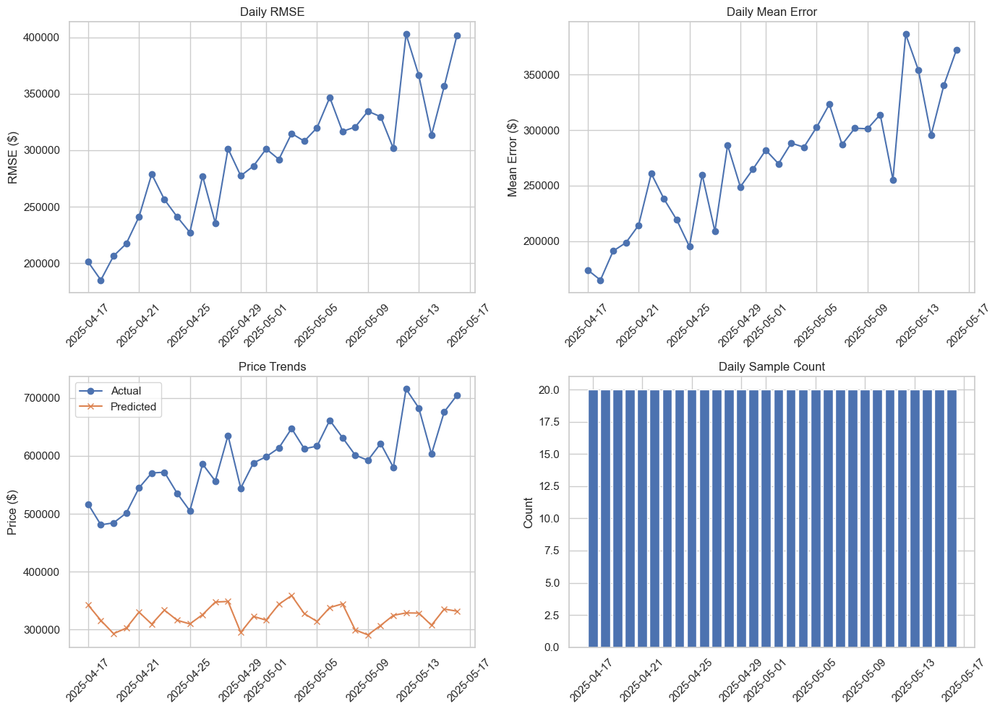

Performance alerts detected:
          date           rmse     mean_error
0   2025-04-17  201115.229115  174117.592216
1   2025-04-18  185035.588868  165008.020481
2   2025-04-19  206360.156652  191184.150077
3   2025-04-20  217322.658788  198624.724585
4   2025-04-21  241066.750374  214365.335131
5   2025-04-22  278848.867048  260855.674459
6   2025-04-23  256320.245530  238018.091702
7   2025-04-24  241044.029054  219198.076770
8   2025-04-25  227211.523186  195157.788297
9   2025-04-26  277127.390021  259897.153739
10  2025-04-27  235576.912499  208911.030150
11  2025-04-28  301402.854429  286492.782787
12  2025-04-29  277364.347799  248989.809172
13  2025-04-30  286018.981435  265004.032517
14  2025-05-01  301221.318186  282035.334186
15  2025-05-02  291929.310878  269828.560772
16  2025-05-03  314846.980796  288351.370269
17  2025-05-04  308065.014518  284670.447051
18  2025-05-05  319998.223676  302670.965056
19  2025-05-06  346813.596485  323331.719149
20  2025-05-07  316722.557

In [42]:
# Model monitoring setup
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Simulated production data and predictions
def simulate_production_data(days=30, samples_per_day=20):
    """Simulate incoming production data and predictions"""
    all_data = []
    
    for day in range(days):
        date = datetime.datetime.now() - datetime.timedelta(days=days-day)
        
        # Generate sample houses similar to training data but with some drift
        drift_factor = 1 + (day / (days * 3))  # Gradual price increase
        
        for _ in range(samples_per_day):
            # Create sample house
            sample = {
                'date': date,
                'MedInc': np.random.uniform(2, 10),
                'HouseAge': np.random.uniform(5, 50),
                'AveRooms': np.random.uniform(3, 8),
                'AveBedrms': np.random.uniform(1, 3),
                'Population': np.random.uniform(500, 5000),
                'AveOccup': np.random.uniform(2, 5),
                'Latitude': np.random.uniform(37, 38),
                'Longitude': np.random.uniform(-123, -121),
                'Location': np.random.choice(['North', 'North-Central', 'Central', 'South-Central', 'South'])
            }
            
            # True price (simulated)
            true_price = (
                sample['MedInc'] * 60000 + 
                sample['AveRooms'] * 30000 + 
                np.random.normal(0, 20000)
            ) * drift_factor
            
            # Model prediction
            pred_price = predict_price(sample)
            
            # Add to data
            sample['true_price'] = true_price
            sample['predicted_price'] = pred_price
            sample['error'] = true_price - pred_price
            
            all_data.append(sample)
    
    # Convert to DataFrame
    return pd.DataFrame(all_data)

# Simulate production data
prod_data = simulate_production_data()

# Calculate daily metrics
daily_metrics = prod_data.groupby(prod_data['date'].dt.date).agg({
    'error': ['mean', 'std'],
    'true_price': ['mean', 'count'],
    'predicted_price': ['mean']
}).reset_index()

# Flatten column names
daily_metrics.columns = [
    'date', 'mean_error', 'std_error', 'mean_price', 'count', 'mean_predicted'
]

# Calculate RMSE by day
daily_metrics['rmse'] = daily_metrics.apply(
    lambda row: np.sqrt(mean_squared_error(
        prod_data[prod_data['date'].dt.date == row['date']]['true_price'],
        prod_data[prod_data['date'].dt.date == row['date']]['predicted_price']
    )),
    axis=1
)

# Plot metrics over time
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# RMSE over time
axes[0, 0].plot(daily_metrics['date'], daily_metrics['rmse'], marker='o')
axes[0, 0].set_title('Daily RMSE')
axes[0, 0].set_ylabel('RMSE ($)')
axes[0, 0].tick_params(axis='x', rotation=45)

# Mean error over time
axes[0, 1].plot(daily_metrics['date'], daily_metrics['mean_error'], marker='o')
axes[0, 1].set_title('Daily Mean Error')
axes[0, 1].set_ylabel('Mean Error ($)')
axes[0, 1].tick_params(axis='x', rotation=45)

# Price trends
axes[1, 0].plot(daily_metrics['date'], daily_metrics['mean_price'], marker='o', label='Actual')
axes[1, 0].plot(daily_metrics['date'], daily_metrics['mean_predicted'], marker='x', label='Predicted')
axes[1, 0].set_title('Price Trends')
axes[1, 0].set_ylabel('Price ($)')
axes[1, 0].legend()
axes[1, 0].tick_params(axis='x', rotation=45)

# Sample count
axes[1, 1].bar(daily_metrics['date'], daily_metrics['count'])
axes[1, 1].set_title('Daily Sample Count')
axes[1, 1].set_ylabel('Count')
axes[1, 1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

# Define alerting thresholds
rmse_threshold = rmse_tuned * 1.5
error_threshold = rmse_tuned

# Check for alerts
alerts = daily_metrics[
    (daily_metrics['rmse'] > rmse_threshold) | 
    (abs(daily_metrics['mean_error']) > error_threshold)
]

if not alerts.empty:
    print("Performance alerts detected:")
    print(alerts[['date', 'rmse', 'mean_error']])
    print("\nRecommendation: Consider retraining the model with more recent data.")
else:
    print("Model performance is within expected thresholds.")

## 10. Summary and Future Directions

### 10.1 Recap of the AI-ML Journey

The AI-ML process is a comprehensive journey that encompasses:

1. **Problem Definition**: Clearly defining business problems that AI can solve
2. **Data Collection and Preparation**: Gathering, cleaning, and preparing data
3. **Feature Engineering**: Creating meaningful features for models
4. **Model Selection and Training**: Selecting and training appropriate algorithms
5. **Evaluation and Tuning**: Measuring and improving model performance
6. **Model Interpretation**: Understanding how models make decisions
7. **Deployment**: Putting models into production systems
8. **Monitoring and Maintenance**: Tracking performance and updating models

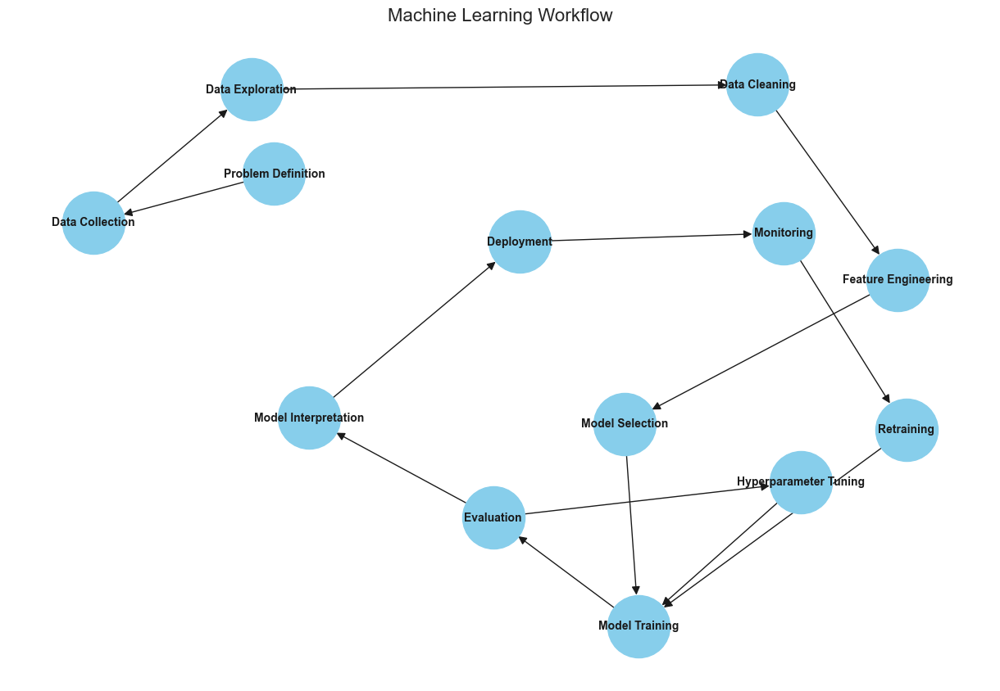

In [43]:
import matplotlib.pyplot as plt
import networkx as nx

# Create directed graph
G = nx.DiGraph()

# Add nodes
nodes = [
    "Problem Definition",
    "Data Collection",
    "Data Exploration",
    "Data Cleaning",
    "Feature Engineering",
    "Model Selection",
    "Model Training",
    "Evaluation",
    "Hyperparameter Tuning",
    "Model Interpretation",
    "Deployment",
    "Monitoring",
    "Retraining"
]

for node in nodes:
    G.add_node(node)

# Add edges
edges = [
    ("Problem Definition", "Data Collection"),
    ("Data Collection", "Data Exploration"),
    ("Data Exploration", "Data Cleaning"),
    ("Data Cleaning", "Feature Engineering"),
    ("Feature Engineering", "Model Selection"),
    ("Model Selection", "Model Training"),
    ("Model Training", "Evaluation"),
    ("Evaluation", "Hyperparameter Tuning"),
    ("Hyperparameter Tuning", "Model Training"),
    ("Evaluation", "Model Interpretation"),
    ("Model Interpretation", "Deployment"),
    ("Deployment", "Monitoring"),
    ("Monitoring", "Retraining"),
    ("Retraining", "Model Training")
]

for edge in edges:
    G.add_edge(edge[0], edge[1])

# Plot graph
plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, seed=42, k=0.5)
nx.draw(G, pos, with_labels=True, node_size=3000, node_color='skyblue', 
        font_size=10, font_weight='bold', arrows=True, arrowsize=15)
plt.title("Machine Learning Workflow", fontsize=16)

# Adjust layout manually instead of tight_layout
plt.subplots_adjust(left=0.05, right=0.95, top=0.9, bottom=0.05)

plt.show()

### 10.2 Current Trends in AI-ML

Major trends reshaping the AI-ML landscape include:

1. **Large Language Models (LLMs)**: Transforming natural language processing
2. **Multimodal Models**: Combining text, vision, and other modalities
3. **AI Democratization**: Making AI accessible through AutoML and no-code solutions
4. **Edge AI**: Deploying models on edge devices for real-time processing
5. **Explainable AI**: Making black-box models more interpretable
6. **Privacy-Preserving ML**: Techniques like federated learning and differential privacy
7. **Efficient ML**: Making models smaller and more energy-efficient

### 10.3 Future Directions

As the field evolves, key future directions include:

1. **AI Alignment**: Ensuring AI systems align with human values and intentions
2. **Human-AI Collaboration**: Building systems that enhance human capabilities
3. **Continual Learning**: Developing models that learn continuously without forgetting
4. **Self-Supervised Learning**: Reducing reliance on labeled data
5. **Neuromorphic Computing**: Hardware designed to mimic brain structures
6. **Embodied AI**: AI systems that can interact with the physical world
7. **General AI**: Progress toward more flexible, general-purpose AI systems

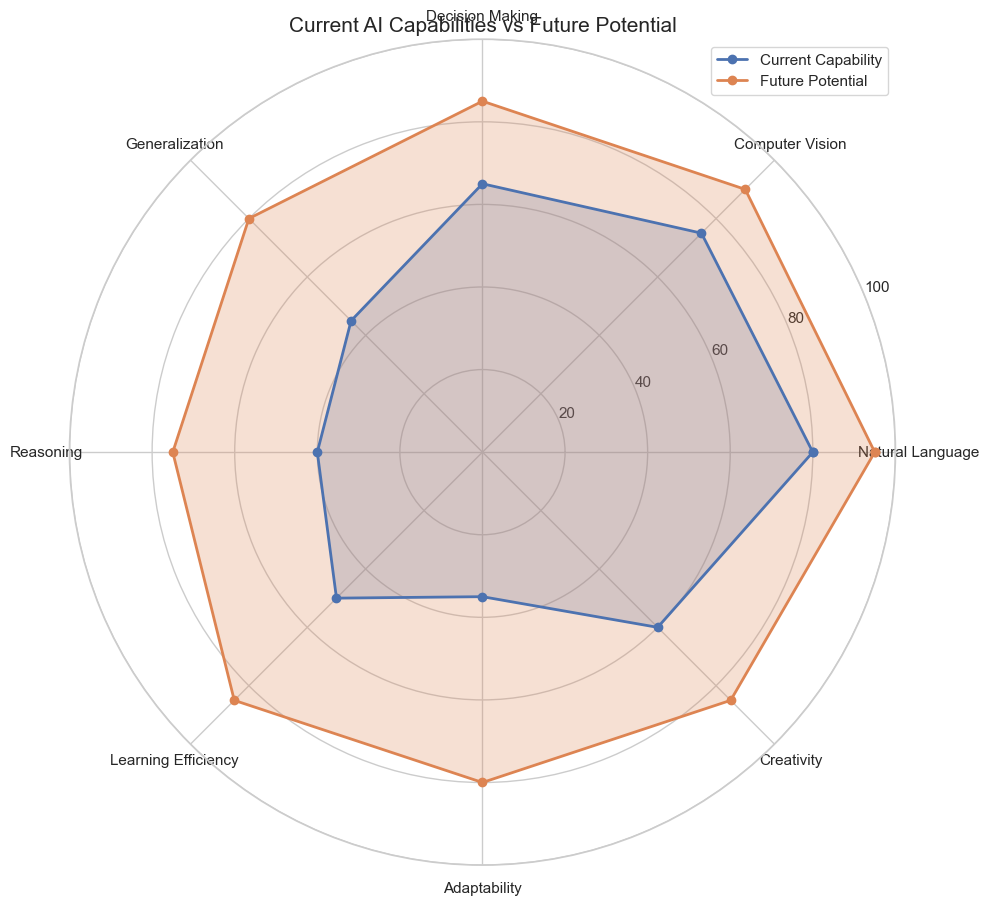

In [44]:
# Visualization of AI capability and future trends
import matplotlib.pyplot as plt
import numpy as np

# Data for radar chart
categories = [
    'Natural Language',
    'Computer Vision',
    'Decision Making',
    'Generalization',
    'Reasoning',
    'Learning Efficiency',
    'Adaptability',
    'Creativity'
]

# Values from 0-100 for current capability and future potential
current = np.array([80, 75, 65, 45, 40, 50, 35, 60])
future = np.array([95, 90, 85, 80, 75, 85, 80, 85])

# Create radar chart
angles = np.linspace(0, 2*np.pi, len(categories), endpoint=False).tolist()
angles += angles[:1]  # Close the loop

current = np.concatenate((current, [current[0]]))  # Close the loop
future = np.concatenate((future, [future[0]]))  # Close the loop

fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))

ax.plot(angles, current, 'o-', linewidth=2, label='Current Capability')
ax.fill(angles, current, alpha=0.25)
ax.plot(angles, future, 'o-', linewidth=2, label='Future Potential')
ax.fill(angles, future, alpha=0.25)

ax.set_thetagrids(np.degrees(angles[:-1]), categories)
ax.set_ylim(0, 100)
ax.grid(True)
ax.set_title('Current AI Capabilities vs Future Potential', size=15)
ax.legend(loc='upper right')

plt.tight_layout()
plt.show()

### 10.4 Continuous Learning Strategies

To stay current in the rapidly evolving AI-ML field:

1. **Follow Research Papers**: Track publications from major conferences like NeurIPS, ICML, and CVPR
2. **Experiment with New Tools**: Try emerging frameworks and libraries
3. **Join Communities**: Participate in forums like Kaggle, Stack Overflow, and GitHub
4. **Read Technical Blogs**: Follow blogs from research labs and tech companies
5. **Take Online Courses**: Continuously update your skills through courses
6. **Contribute to Open Source**: Participate in open-source AI projects
7. **Attend Meetups and Conferences**: Connect with others in the field

### 10.5 Final Thoughts

The AI-ML field continues to evolve at an extraordinary pace, bringing powerful new tools and capabilities. As practitioners, our responsibility is to harness these technologies ethically and responsibly, solving real problems while being mindful of potential impacts. The future is bright for those who can combine technical expertise with domain knowledge and ethical considerations.

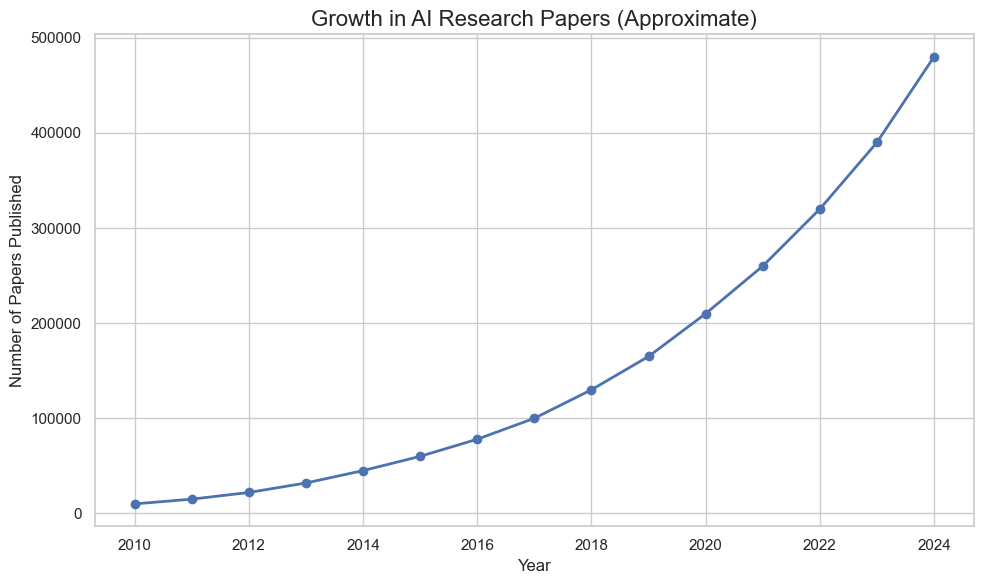

Thank you for exploring the AI-ML journey! Remember that the most successful
applications come from clearly defined problems, quality data, appropriate
models, and responsible deployment. Keep learning and experimenting!


In [45]:
# Closing visualization: Growth of AI research over time
years = np.arange(2010, 2025)
papers = [10000, 15000, 22000, 32000, 45000, 60000, 78000, 
          100000, 130000, 165000, 210000, 260000, 320000, 390000, 480000]

plt.figure(figsize=(10, 6))
plt.plot(years, papers, marker='o', linewidth=2)
plt.title('Growth in AI Research Papers (Approximate)', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Number of Papers Published', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

# Final message
print("Thank you for exploring the AI-ML journey! Remember that the most successful")
print("applications come from clearly defined problems, quality data, appropriate")
print("models, and responsible deployment. Keep learning and experimenting!")